# CNN-RNN Model Training, Dependent Labels
## Author: Ian Scarff (iie728)

In [1]:
import pandas as pd
import numpy as np
import json
import os
import imageio
import matplotlib.pyplot as plt
import seaborn as sns
import random
from sklearn.preprocessing import MultiLabelBinarizer
import time
import datetime

import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torchvision
import torch.nn.functional as F
from torchvision import transforms
from torchvision import models
from torch.utils.data import DataLoader, SubsetRandomSampler
from sklearn.model_selection import KFold
import skimage

from sklearn.metrics import accuracy_score, f1_score, recall_score, precision_score

import warnings
warnings.filterwarnings('ignore')

## Setup

In [2]:
classes = ['Smears', 'Loaded Language', 'Name calling/Labeling', 'Glittering generalities (Virtue)',
               'Appeal to (Strong) Emotions', 'Appeal to fear/prejudice', 'Transfer', 'Doubt',
               'Exaggeration/Minimisation', 'Whataboutism', 'Slogans', 'Flag-waving',
               "Misrepresentation of Someone's Position (Straw Man)", 'Causal Oversimplification',
               'Thought-terminating cliché', 'Black-and-white Fallacy/Dictatorship', 'Appeal to authority',
               'Reductio ad hitlerum', 'Repetition', 'Obfuscation, Intentional vagueness, Confusion',
               'Presenting Irrelevant Data (Red Herring)', 'Bandwagon']

### Create Class Binarizer
one_hot = MultiLabelBinarizer()
one_hot.fit([classes])

MultiLabelBinarizer()

In [3]:
from CustomLoader import ImageLoader

In [4]:
training_data = ImageLoader(json_file = 'training_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

testing_data = ImageLoader(json_file = 'testing_data.json', root_dir = 'Images',
                           transform = transforms.Compose([
                               transforms.ToTensor(),
                               transforms.Resize(size = (224,224)),
                               transforms.Normalize((0.5,0.5,0.5), (0.5,0.5,0.5)) ### Pixel range [-1,1]
                           ]))

In [5]:
train_loader = DataLoader(dataset = training_data, batch_size = 25, shuffle = True)
test_loader = DataLoader(dataset = testing_data, batch_size = 25, shuffle = True)

# 
# 

## Define CNN-RNN Architectures (Set Hidden Size)

### ResNet18-LSTM

In [6]:
### Define Class
class ResNet18_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet18_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet18 = models.resnet18(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet18.fc.in_features
        
        ### Freeze Parameters
        for param in resnet18.parameters():
            param.requires_grad = False
            
        ### CNN Encoder, remove prediction layer
        self.cnn = nn.Sequential(*list(resnet18.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)   
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet50-LSTM

In [7]:
### Define Class
class ResNet50_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet50_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet50 = models.resnet50(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet50.fc.in_features
        
        for param in resnet50.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet50.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)    
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### ResNet101-LSTM

In [8]:
### Define Class
class ResNet101_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(ResNet101_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import ResNet18
        resnet101 = models.resnet101(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = resnet101.fc.in_features
        
        for param in resnet101.parameters():
            param.requires_grad = False
        
            
        ### CNN Encoder
        self.cnn = nn.Sequential(*list(resnet101.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images) 
        
        image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet121-LSTM

In [9]:
### Define Class
class DenseNet121_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet121_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet121 = models.densenet121(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 50176 # densenet121.classifier.in_features
        
        for param in densenet121.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet121.children())[:-1])
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
#         self.cnn_output_size = image_emb.shape[0]
        
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)

        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet169-LSTM

In [10]:
### Define Class
class DenseNet169_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet169_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Number of labels
        self.num_labels = 22
        
        
        ### Import DenseNet101
        densenet169 = models.densenet169(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 81536 # densenet169.classifier.in_features
        
        for param in densenet169.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet169.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        image_emb = torch.flatten(image_emb, 1)
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
           
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### DenseNet201-LSTM

In [11]:
### Define Class
class DenseNet201_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(DenseNet201_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
               
        
        ### Import DenseNet101
        densenet201 = models.densenet201(pretrained = True)
    
        ### CNN output size
        self.cnn_output_size = 94080 #densenet201.classifier.in_features
        
        
        for param in densenet201.parameters():
            param.requires_grad = False


        ### CNN Encoder
        self.cnn = nn.Sequential(*list(densenet201.children())[:-1])
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)
        
        
        image_emb = torch.flatten(image_emb, 1)
        
#         image_emb = image_emb.view(-1, self.cnn_output_size)
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG11_BN-LSTM

In [12]:
### Define Class
class VGG11_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG11_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg11bn = models.vgg11_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg11bn.classifier[6].in_features
        
       
        for param in vgg11bn.parameters():
            param.requires_grad = False

        
        vgg11bn.classifier = nn.Sequential(*list(vgg11bn.classifier.children())[:-1])
        
            
        ### CNN Encoder
        self.cnn = vgg11bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
        
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG16_BN-LSTM

In [13]:
### Define Class
class VGG16_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG16_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg16bn = models.vgg16_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg16bn.classifier[6].in_features
        
        for param in vgg16bn.parameters():
            param.requires_grad = False

        
        vgg16bn.classifier = nn.Sequential(*list(vgg16bn.classifier.children())[:-1])

            
        ### CNN Encoder
        self.cnn = vgg16bn
        
        
            
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

### VGG19_BN-LSTM

In [14]:
### Define Class
class VGG19_BN_LSTM(nn.Module):
    def __init__(self, hiddenSize, numLayers, dpout):
        super(VGG19_BN_LSTM, self).__init__()
        
        ### Number of labels
        self.num_labels = 22
        
        ### Import VGG11-BN
        vgg19bn = models.vgg19_bn(pretrained = True)
        
        ### CNN output size
        self.cnn_output_size = vgg19bn.classifier[6].in_features
        
        for param in vgg19bn.parameters():
            param.requires_grad = False

        
        vgg19bn.classifier = nn.Sequential(*list(vgg19bn.classifier.children())[:-1])
            
        ### CNN Encoder
        self.cnn = vgg19bn
        
        
        ### Create LSTM decoder
        self.lstm = nn.LSTM(input_size = 1, 
                              hidden_size = hiddenSize, ### Output size for each hidden state
                              num_layers = numLayers,
                              dropout = dpout, ### Dropout Rate,
                              batch_first = True
                             )
        
        
        ### Shrink embeddings to hidden size
        self.shrink = nn.Linear(self.cnn_output_size, hiddenSize)
        
        ### Prediction layer
        self.prediction_layer = nn.Linear(hiddenSize, 1)
        
        ### Initial weights
        self.init_weights()
        
    
    
    ### Intialize weights
    def init_weights(self):
        nn.init.xavier_uniform(self.shrink.weight)
        self.shrink.bias.data.fill_(0)
        nn.init.xavier_uniform(self.prediction_layer.weight)
        self.prediction_layer.bias.data.fill_(0)
        
    
    ### Forward pass
    def forward(self, images):
        
        ### Pass images to CNN encoder
        image_emb = self.cnn(images)         
        
        ### Prep intial hidden state and cell state
        h0 = torch.unsqueeze(self.shrink(image_emb), 0)
        c0 = torch.autograd.Variable(torch.zeros(h0.size(0), h0.size(1), h0.size(2)).cuda(), requires_grad = False)
        
        zero_input = torch.autograd.Variable(torch.zeros(image_emb.size(0), self.num_labels, 1).cuda(), requires_grad = False)
        
        ### Run through LSTM decoder
        hidden_layers, _ = self.lstm(zero_input, (h0, c0))
        
        ### Unbind the hidden layers
        unbound = torch.unbind(hidden_layers, 1)
        
        ### Run each hidden layer through the prediction linear layer
        combined = [self.prediction_layer(i) for i in unbound]
        
        ### Stack predictions
        combined = torch.stack(combined, 1)
        
        ### Squeeze to remove extra deminsion
        combined = torch.squeeze(combined, 2)
        
        ### Sigmoid activation
        final = F.sigmoid(combined)
        
        return final

# 
# 
# 

## Define Training Methodology

In [15]:
def get_lr(optim):
    for param_group in optim.param_groups:
        return param_group['lr']

In [16]:
### This function is used to train a cnn model
def Kfold_train_CNN_RNN(model = None, training_data = None, learning_rate = None, k_folds = None, n_epochs = None, model_name = None):
    
    ### Check that all entries are valid
    if ((model == None) or (training_data == None) or (model_name == None) or 
        (learning_rate == None) or (k_folds == None) or (n_epochs == None)):
        print ('Enter all info.')
        
        
        
    ### Run K-Fold CV
    else:
        
        device = 'cpu'

        ### Set Loss Function and Optimizer
        criterion = nn.BCELoss()
        
        
        #### Define the K-fold Cross Validator
        kfold = KFold(n_splits=k_folds, shuffle=True)
        
        
        
        ### Create values to hold the best model metrics across folds
        val_f1_mic_max = 0 ### This determines best model
        
        best_train_loss = 0
        best_train_acc = 0
        best_train_f1_mic = 0
        best_train_f1_mac = 0
        best_train_prec_mic = 0
        best_train_prec_mac = 0
        best_train_rec_mic = 0
        best_train_rec_mac = 0

        best_val_acc = 0
        best_val_loss = 0
#         best_val_f1_mic = 0
        best_val_f1_mac = 0
        best_val_prec_mic = 0
        best_val_prec_mac = 0
        best_val_rec_mic = 0
        best_val_rec_mac = 0
        
        best_fold = 0
        best_epoch = 0
        

        
        ### Start print

        start = time.time()
        
        ### K-fold Cross Validation model evaluation
        for fold, (train_ids, val_ids) in enumerate(kfold.split(training_data)):
            
            print('-------------------------------------------')
            print('FOLD {}'.format(fold + 1))
            print('-------------------------------------------')
            
            ### Sample elements randomly from a given list of ids, no replacement
            train_subsampler = SubsetRandomSampler(train_ids)
            val_subsampler = SubsetRandomSampler(val_ids)
            
            ### Define data loaders for training and validation in current fold
            train_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = train_subsampler)
            val_loader = DataLoader(dataset = training_data, batch_size = 25, sampler = val_subsampler)
            
            ### Initialize network
            network = model
            if torch.cuda.is_available():
                network.cuda()
                network = nn.DataParallel(network, list(range(2)))
                device = 'cuda'
            
            ### Initialize optimizer
            optimizer = optim.Adam(network.parameters(), lr=learning_rate)
            scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode = 'min', factor = 0.1, patience = 5)
            
            
            ### Create lists of values at the end of each epoch for each fold
            train_loss = []
            train_acc = []
            train_f1_mic = []
            train_f1_mac = []
            train_prec_mic = []
            train_prec_mac = []
            train_rec_mic = []
            train_rec_mac = []
            
            val_loss = []
            val_acc = []
            val_f1_mic = []
            val_f1_mac = []
            val_prec_mic = []
            val_prec_mac = []
            val_rec_mic = []
            val_rec_mac = []
            
            
            ### Train network
            for epoch in range(n_epochs):
                
                ### Hold training predictions and targets
                train_output = np.empty((0,22), int)
                train_all_targets = np.empty((0,22), int)
                
                val_output = np.empty((0,22), int)
                val_all_targets = np.empty((0,22), int)
                
                
                ### Train ###
                network.train()
                
                train_running_loss = 0.0
                
                batch_number = 0
                for i, data in enumerate(train_loader):
                    
                    images, targets = data[0].to(device), data[1].float().to(device)
                    optimizer.zero_grad()
                    
                    output = network(images)
                    
                    loss = criterion(output, targets) 
                    train_running_loss += loss.item()
                                        
                    ### Append output
                    train_output = np.vstack((train_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    train_all_targets = np.vstack((train_all_targets, targets.cpu().numpy().astype('int')))

                    loss.backward()
                    optimizer.step()
                                        
                    
                ### Calculate metrics and append
                train_loss.append(train_running_loss/len(train_loader.dataset))
                train_acc.append(accuracy_score(train_all_targets, train_output))
                train_f1_mic.append(f1_score(train_all_targets, train_output, average = 'micro'))
                train_f1_mac.append(f1_score(train_all_targets, train_output, average = 'macro'))
                train_prec_mic.append(precision_score(train_all_targets, train_output, average = 'micro'))
                train_prec_mac.append(precision_score(train_all_targets, train_output, average = 'macro'))
                train_rec_mic.append(recall_score(train_all_targets, train_output, average = 'micro'))
                train_rec_mac.append(recall_score(train_all_targets, train_output, average = 'macro'))
                
                
                ### Validate###
                network.eval()
                val_running_loss = 0.0

                                
                for i, data in enumerate(val_loader):
                    images, targets = data[0].to(device), data[1].float().to(device)
                    output = network(images)
                    loss = criterion(output, targets)
                    val_running_loss += loss.item()
                    
                    ### Append output
                    val_output = np.vstack((val_output, ((output > 0.5).cpu().numpy().astype('int'))))
                    val_all_targets = np.vstack((val_all_targets, targets.cpu().numpy().astype('int')))

                
                ### Calculate metrics and append
                val_loss.append(val_running_loss/len(val_loader.dataset))
                val_acc.append(accuracy_score(val_all_targets, val_output))
                val_f1_mic.append(f1_score(val_all_targets, val_output, average = 'micro'))
                val_f1_mac.append(f1_score(val_all_targets, val_output, average = 'macro'))
                val_prec_mic.append(precision_score(val_all_targets, val_output, average = 'micro'))
                val_prec_mac.append(precision_score(val_all_targets, val_output, average = 'macro'))
                val_rec_mic.append(recall_score(val_all_targets, val_output, average = 'micro'))
                val_rec_mac.append(recall_score(val_all_targets, val_output, average = 'macro'))
                
                
                ### Save model with the lowest validation loss
                if val_f1_mic[epoch] > val_f1_mic_max:
                    print('Validation F1 Micro Score Increased ({:.6f} --> {:.6f}).  Saving model ...\n'.format(
                    val_f1_mic_max,
                    val_f1_mic[epoch]))
                    torch.save(network.state_dict(), 'BestCnnRnnModelsV2/' + model_name +'.pt')
                    val_f1_mic_max = val_f1_mic[epoch]
                    
                    ### Set current best metrics
                    best_train_loss = train_loss[epoch]
                    best_train_acc = train_acc[epoch]
                    best_train_f1_mic = train_f1_mic[epoch]
                    best_train_f1_mac = train_f1_mac[epoch]
                    best_train_prec_mic = train_prec_mic[epoch]
                    best_train_prec_mac = train_prec_mac[epoch]
                    best_train_rec_mic = train_rec_mic[epoch]
                    best_train_rec_mac = train_rec_mac[epoch]

                    best_val_acc = val_acc[epoch]
                    best_val_loss = val_loss[epoch]
#                     best_val_f1_mic = val_f1_mic[epoch]
                    best_val_f1_mac = val_f1_mac[epoch]
                    best_val_prec_mic = val_prec_mic[epoch]
                    best_val_prec_mac = val_prec_mac[epoch]
                    best_val_rec_mic = val_rec_mic[epoch]
                    best_val_rec_mac = val_rec_mac[epoch]

                    best_fold = fold + 1
                    best_epoch = epoch + 1
                    
                    
                    
                ### Display summary for epoch
                print('Epoch {} \tLearning Rate: {} \tTime (min): {}'.format(epoch+1, get_lr(optimizer), round((time.time()-start)/60, 2)))
                print('Train Loss: {} \tValidation Loss: {}'. format(round(train_loss[epoch], 4),
                                                                     round(val_loss[epoch], 4)))
                print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(train_acc[epoch], 4),
                                                                            round(val_acc[epoch], 4)))
                print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(train_f1_mic[epoch], 4),
                                                                            round(val_f1_mic[epoch], 4)))
                print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(train_f1_mac[epoch], 4),
                                                                            round(val_f1_mac[epoch], 4)))
                print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(train_prec_mic[epoch], 4),
                                                                                          round(val_prec_mic[epoch], 4)))
                print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(train_prec_mac[epoch], 4),
                                                                                          round(val_prec_mac[epoch], 4)))
                print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(train_rec_mic[epoch], 4),
                                                                                    round(val_rec_mic[epoch], 4)))
                print('Train Recall Marco: {} \tValidation Recall Macro: {}\n'.format(round(train_rec_mac[epoch], 4),
                                                                                    round(val_rec_mac[epoch], 4)))
                
                
                ### Update learning rate if needed
                scheduler.step(val_loss[epoch])
                
                
                
            ### Display summary graph of fold
            fig, (ax1, ax3) = plt.subplots(1,2, figsize = (20,6))
            ax1.set_xlabel('Epoch')
            ax1.set_ylabel('Loss')
            ln1 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), train_loss, label = 'Train Loss')
            ln2 = ax1.plot(np.arange(start = 1, stop = n_epochs + 1), val_loss, label = 'Val Loss')
            
            ax2 = ax1.twinx()
            ax2.set_ylabel('Accuracy')
            ln3 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), train_acc, marker = 'o', label = 'Train Acc')
            ln4 = ax2.plot(np.arange(start = 1, stop = n_epochs + 1), val_acc, marker = 'o', label = 'Val Acc')
            
            lns1 = ln1 + ln2 + ln3 + ln4
            labs1 = [l.get_label() for l in lns1]
            
            ax3.set_xlabel('Epoch')
            ax3.set_ylabel('Score')
            ln5 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mic, marker = 'v', label = 'Train F1 Micro')
            ln6 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mic, marker = 'v', label = 'Val F1 Micro')
            ln7 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_f1_mac, marker = '^', label = 'Train F1 Macro')
            ln8 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_f1_mac, marker = '^', label = 'Val F1 Micro')
            ln9 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mic, marker = 'd', label = 'Train Prec. Micro')
            ln10 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mic, marker = 'd', label = 'Val Prec. Micro')
            ln11 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_prec_mac, marker = 'X', label = 'Train Prec. Macro')
            ln12 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_prec_mac, marker = 'X', label = 'Val Prec. Macro')
            ln13 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mic, marker = 'P', label = 'Train Rec. Micro')
            ln14 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mic, marker = 'P', label = 'Val Rec. Micro')
            ln15 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), train_rec_mac, marker = 's', label = 'Train Rec. Macro')
            ln16 = ax3.plot(np.arange(start = 1, stop = n_epochs + 1), val_rec_mac, marker = 's', label = 'Val Rec. Macro')
            
            lns2 = ln5 + ln6 + ln7 + ln8 +  ln9 + ln10 + ln11 + ln12 + ln13 + ln14 + ln15 + ln16
            labs2 = [l.get_label() for l in lns2]
            
            
            ax1.legend(lns1, labs1, loc = 'upper left', bbox_to_anchor = (1.1,1))
            ax3.legend(lns2, labs2, loc = 'upper left', bbox_to_anchor = (1.05,1))
            fig.tight_layout()
            
            plt.show()
            
            fig.savefig('CNN_RNN_700_1_0_TrainingSummary/' + model_name + '_FOLD' + str(fold+1) + '.png')
        
        
        
        ### Display metrics of the best model
                
        print('------------------------------------------------------------')
        print('------------------------------------------------------------')
        
        print('\nMetrics of Best Model:')
        print('Fold: {} \tEpoch: {}'.format(best_fold, best_epoch))
        print('Train Loss: {} \tValidation Loss: {}'. format(round(best_train_loss, 4),
                                                             round(best_val_loss, 4)))
        print('Train Accuracy: {} \tValidation Accuracy: {}'.format(round(best_train_acc, 4),
                                                                    round(best_val_acc, 4)))
        print('Train F1 Mirco: {} \tValidation F1 Micro: {}'.format(round(best_train_f1_mic, 4),
                                                                    round(val_f1_mic_max, 4)))
        print('Train F1 Marco: {} \tValidation F1 Macro: {}'.format(round(best_train_f1_mac, 4),
                                                                    round(best_val_f1_mac, 4)))
        print('Train Precision Mirco: {} \tValidation Precision Micro: {}'.format(round(best_train_prec_mic, 4),
                                                                                  round(best_val_prec_mic, 4)))
        print('Train Precision Marco: {} \tValidation Precision Macro: {}'.format(round(best_train_prec_mac, 4),
                                                                                  round(best_val_prec_mac, 4)))
        print('Train Recall Mirco: {} \tValidation Recall Micro: {}'.format(round(best_train_rec_mic, 4),
                                                                            round(best_val_rec_mic, 4)))
        print('Train Recall Marco: {} \tValidation Recall Macro: {}'.format(round(best_train_rec_mac, 4),
                                                                            round(best_val_rec_mac, 4)))
        
        
        ### Return best metrics
        return [best_fold, best_epoch, best_train_loss, best_train_acc, best_train_f1_mic, best_train_f1_mac, best_train_prec_mic, best_train_prec_mac, best_train_rec_mic, best_train_rec_mac,
                best_val_loss, best_val_acc, val_f1_mic_max, best_val_f1_mac, best_val_prec_mic, best_val_prec_mac, best_val_rec_mic, best_val_rec_mac]
  

# 
# 

## Initialize Models: Hidden Size = 700, Number of Layers = 1, Dropout = 0

In [17]:
resnet18LSTM_700_1_0 = ResNet18_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
resnet50LSTM_700_1_0 = ResNet50_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
resnet101LSTM_700_1_0 = ResNet101_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)

densenet121LSTM_700_1_0 = DenseNet121_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
densenet169LSTM_700_1_0 = DenseNet169_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
densenet201LSTM_700_1_0 = DenseNet201_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)

vgg11bnLSTM_700_1_0 = VGG11_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
vgg16bnLSTM_700_1_0 = VGG16_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)
vgg19bnLSTM_700_1_0 = VGG19_BN_LSTM(hiddenSize = 700, numLayers = 1, dpout = 0)

# 
# 

## Train Models

In [18]:
START = time.time()

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.17
Train Loss: 0.0165 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0554 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0383 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1133 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1132 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0367 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0373 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.3
Train Loss: 0.0132 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

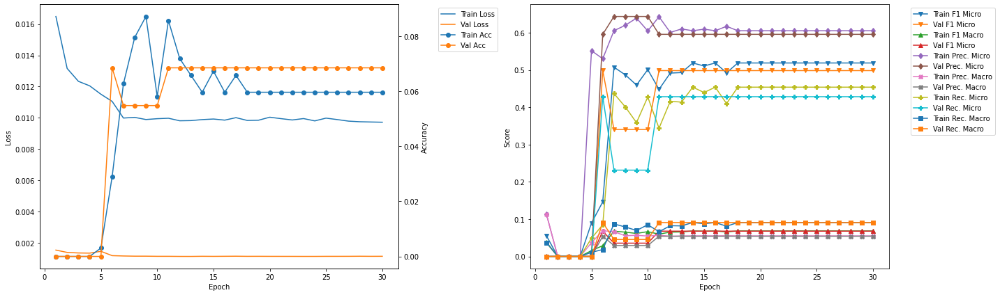

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 3.98
Train Loss: 0.0104 	Validation Loss: 0.0012
Train Accuracy: 0.055 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4626 	Validation F1 Micro: 0.4655
Train F1 Marco: 0.0697 	Validation F1 Macro: 0.0647
Train Precision Mirco: 0.5804 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0779 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.3845 	Validation Recall Micro: 0.401
Train Recall Marco: 0.0795 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.1
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.081 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4872 	Validation F1 Micro: 0.4655
Train F1 Marco: 0.0651 	Validation F1 Macro: 0.0647
Train Precision Mirco: 0.6273 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0561 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.3983 	Va

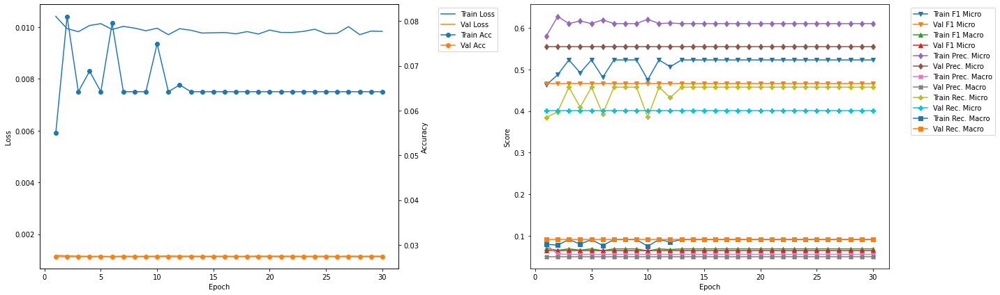

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.498567 --> 0.500000).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 7.76
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5125 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6056 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4443 	Validation Recall Micro: 0.4343
Train Recall Marco: 0.0889 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 7.89
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4843 	Validation F1 Micro: 0.5
Train F1 Marco: 0.0646 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6079 	Validation Precision Micro: 0.589
Train Precision Marc

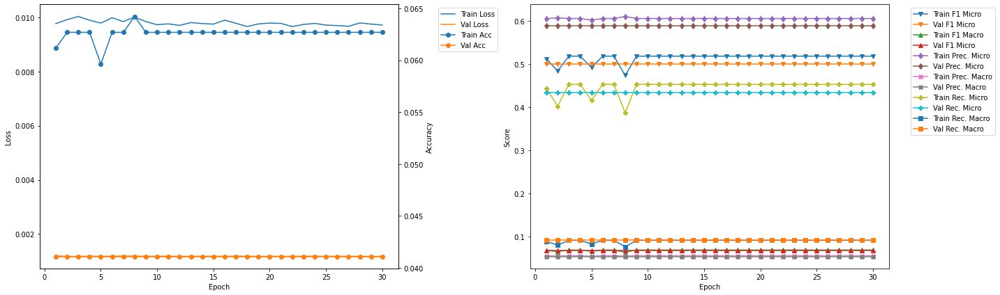

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.500000 --> 0.532164).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 11.55
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4833 	Validation F1 Micro: 0.5322
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0696
Train Precision Mirco: 0.6071 	Validation Precision Micro: 0.6233
Train Precision Marco: 0.0544 	Validation Precision Macro: 0.0567
Train Recall Mirco: 0.4015 	Validation Recall Micro: 0.4643
Train Recall Marco: 0.08 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.68
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0596 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5152 	Validation F1 Micro: 0.5322
Train F1 Marco: 0.0682 	Validation F1 Macro: 0.0696
Train Precision Mirco: 0.6024 	Validation Precision Micro: 0.6233
Train Precis

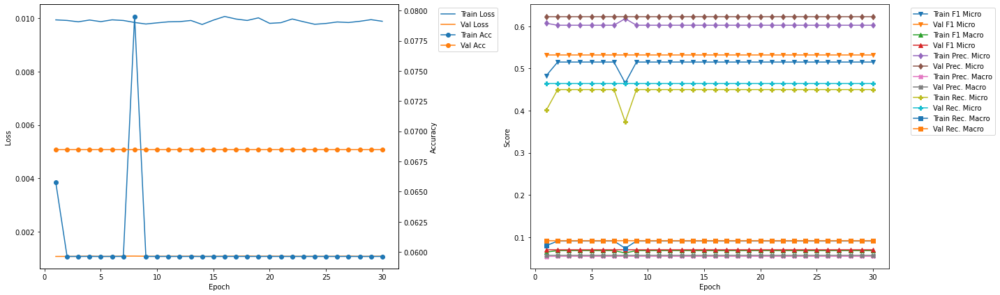

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 15.34
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5166 	Validation F1 Micro: 0.5194
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0676
Train Precision Mirco: 0.6055 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.055 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4505 	Validation Recall Micro: 0.4603
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 15.47
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4849 	Validation F1 Micro: 0.5194
Train F1 Marco: 0.065 	Validation F1 Macro: 0.0676
Train Precision Mirco: 0.6105 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.4022 	

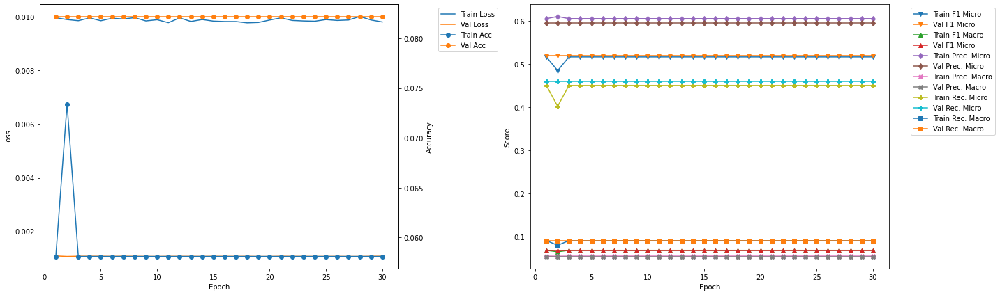

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.14
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.5182 	Validation F1 Micro: 0.5057
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4538 	Validation Recall Micro: 0.432
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.26
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.5182 	Validation F1 Micro: 0.5057
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.604 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4538 

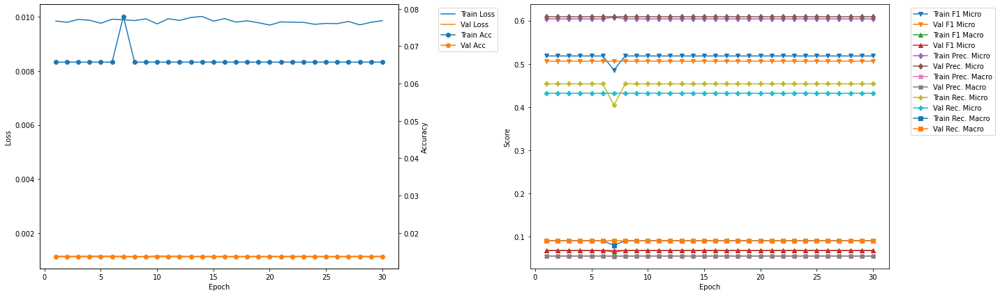

-------------------------------------------
FOLD 7
-------------------------------------------
Validation F1 Micro Score Increased (0.532164 --> 0.548673).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 22.92
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5134 	Validation F1 Micro: 0.5487
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.6009 	Validation Precision Micro: 0.637
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0579
Train Recall Mirco: 0.4481 	Validation Recall Micro: 0.4819
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.04
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.5134 	Validation F1 Micro: 0.5487
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0707
Train Precision Mirco: 0.6009 	Validation Precision Micro: 0.637
Train Precisio

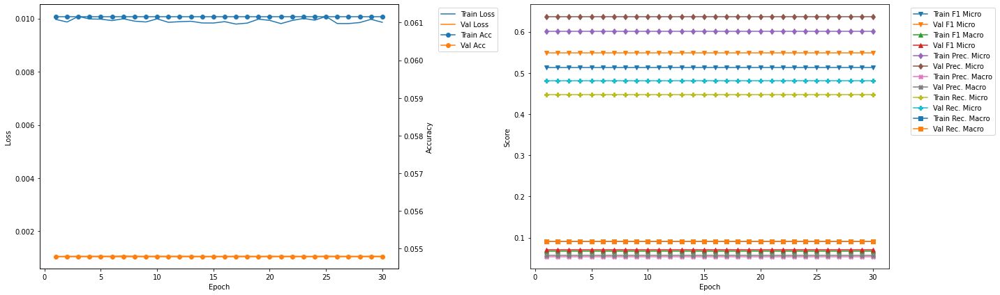

-------------------------------------------
FOLD 8
-------------------------------------------
Validation F1 Micro Score Increased (0.548673 --> 0.554217).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 26.71
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5129 	Validation F1 Micro: 0.5542
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0706
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.4474 	Validation Recall Micro: 0.4894
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.83
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5129 	Validation F1 Micro: 0.5542
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0706
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.6389
Train Precisio

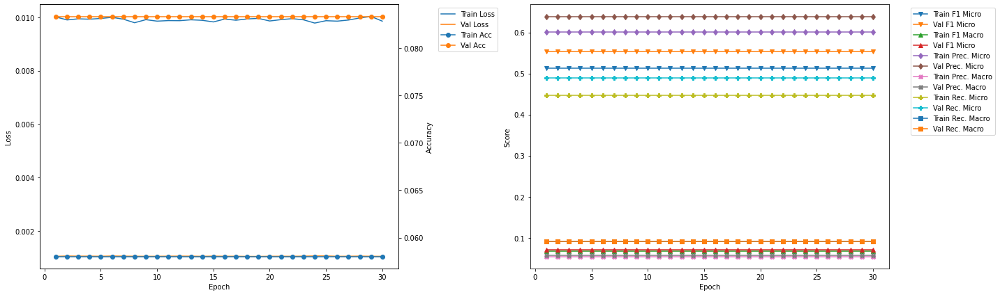

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.49
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5148 	Validation F1 Micro: 0.5366
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4487 	Validation Recall Micro: 0.4783
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.62
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5148 	Validation F1 Micro: 0.5366
Train F1 Marco: 0.0683 	Validation F1 Macro: 0.0684
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4487

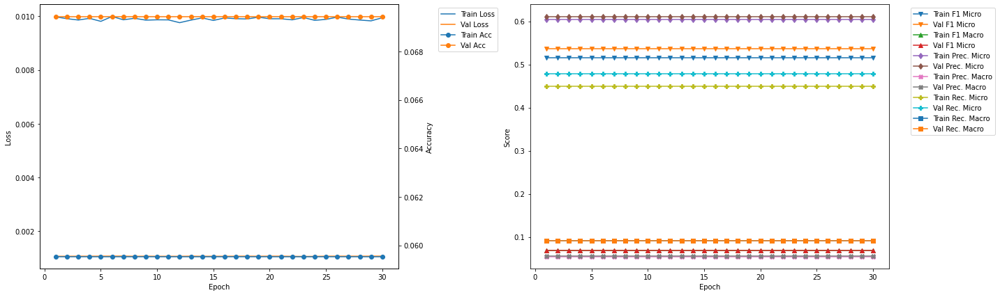

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.28
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0565 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5174 	Validation F1 Micro: 0.512
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.4514 	Validation Recall Micro: 0.4521
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.41
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0565 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.5174 	Validation F1 Micro: 0.512
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0674
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5903
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0537
Train Recall Mirco: 0.451

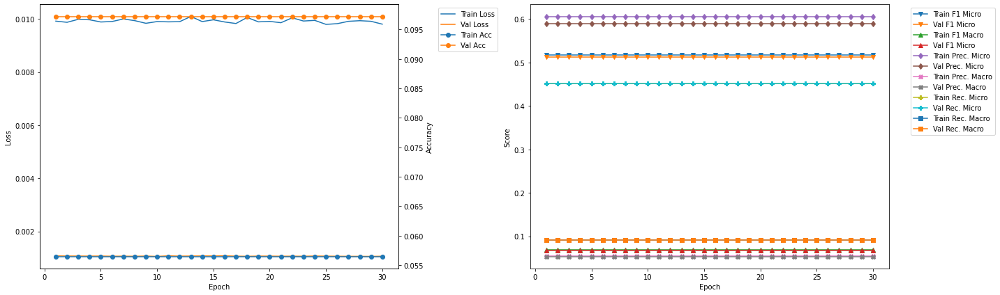

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 1
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.058 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5129 	Validation F1 Micro: 0.5542
Train F1 Marco: 0.0681 	Validation F1 Macro: 0.0706
Train Precision Mirco: 0.6008 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0581
Train Recall Mirco: 0.4474 	Validation Recall Micro: 0.4894
Train Recall Marco: 0.0909 	Validation Recall Macro: 0.0909


In [19]:
resnet18LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = resnet18LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet18LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.14
Train Loss: 0.019 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0792 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0411 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1791 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1115 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0508 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0346 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.28
Train Loss: 0.0137 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

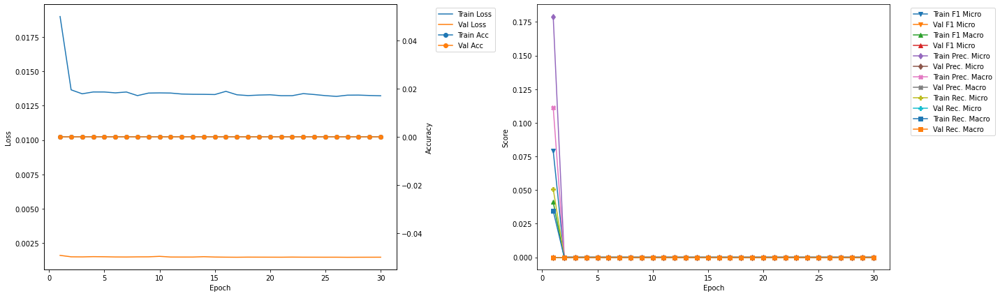

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.4
Train Loss: 0.0137 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 4.55
Train Loss: 0.0134 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Ma

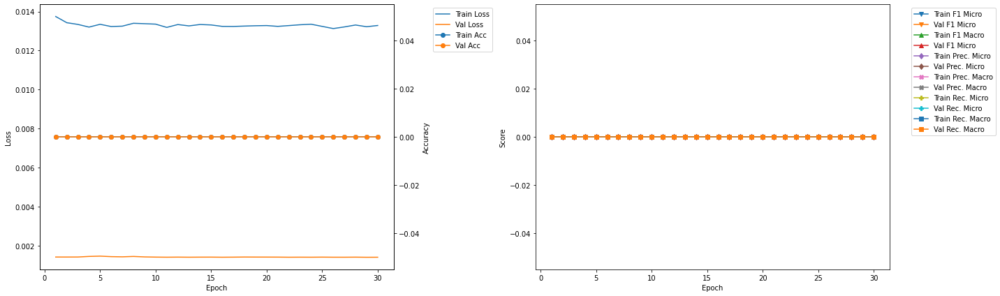

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 8.66
Train Loss: 0.0134 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 8.8
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Ma

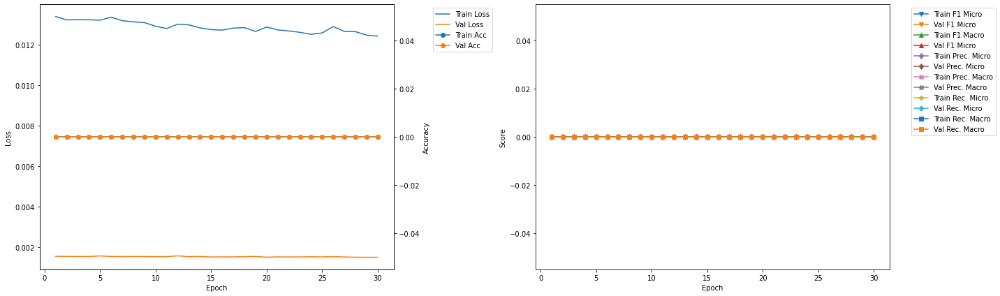

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.93
Train Loss: 0.0131 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0441 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0135 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.328 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0339 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0236 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0106 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.07
Train Loss: 0.0126 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	

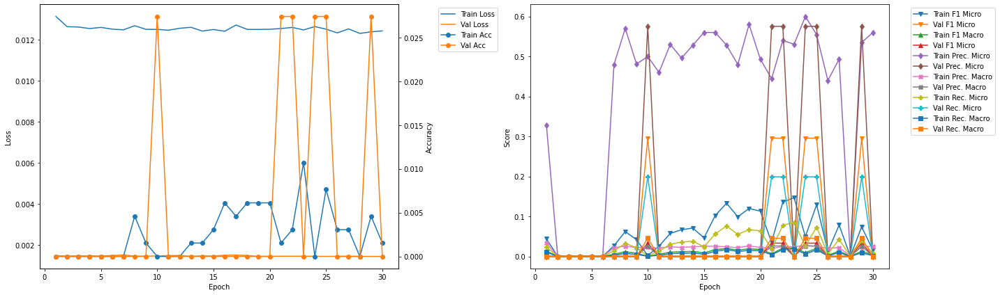

-------------------------------------------
FOLD 5
-------------------------------------------
Validation F1 Micro Score Increased (0.295775 --> 0.296578).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 17.2
Train Loss: 0.0128 	Validation Loss: 0.0014
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.095 	Validation F1 Micro: 0.2966
Train F1 Marco: 0.0157 	Validation F1 Macro: 0.0317
Train Precision Mirco: 0.514 	Validation Precision Micro: 0.5342
Train Precision Marco: 0.0234 	Validation Precision Macro: 0.0243
Train Recall Mirco: 0.0524 	Validation Recall Micro: 0.2053
Train Recall Marco: 0.0118 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.34
Train Loss: 0.0126 	Validation Loss: 0.0014
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0963 	Validation F1 Micro: 0.0
Train F1 Marco: 0.016 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5314 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0242

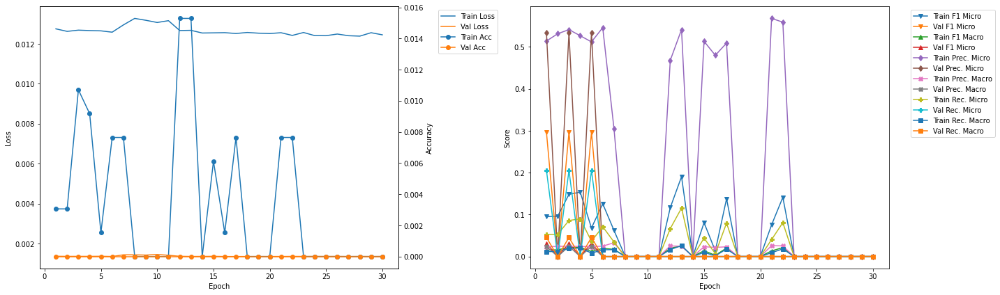

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.46
Train Loss: 0.0136 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0009 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.04 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0018 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0006 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.6
Train Loss: 0.0129 	Validation Loss: 0.0013
Train Accuracy: 0.0031 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0447 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0088 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5467 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0248 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0233 	Validation Recall Micro: 0.0
Train Rec

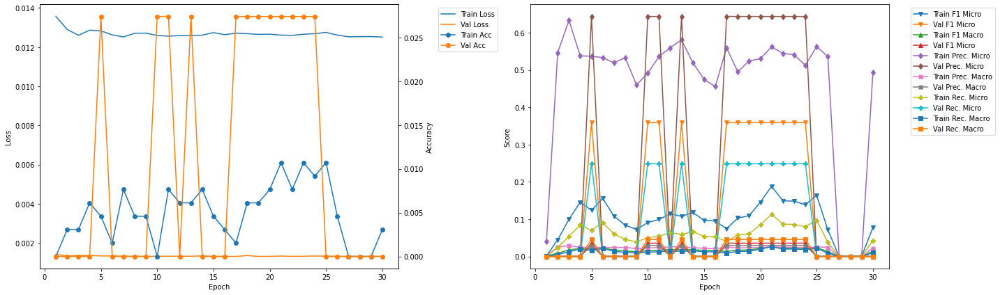

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.72
Train Loss: 0.0129 	Validation Loss: 0.0014
Train Accuracy: 0.0076 	Validation Accuracy: 0.0
Train F1 Mirco: 0.1628 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0229 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5567 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0253 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0953 	Validation Recall Micro: 0.0
Train Recall Marco: 0.021 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.86
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0076 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.172 	Validation F1 Micro: 0.2388
Train F1 Marco: 0.0235 	Validation F1 Macro: 0.0277
Train Precision Mirco: 0.5441 	Validation Precision Micro: 0.4384
Train Precision Marco: 0.0247 	Validation Precision Macro: 0.0199
Train Recall Mirco: 0.1022 	Validation Recall M

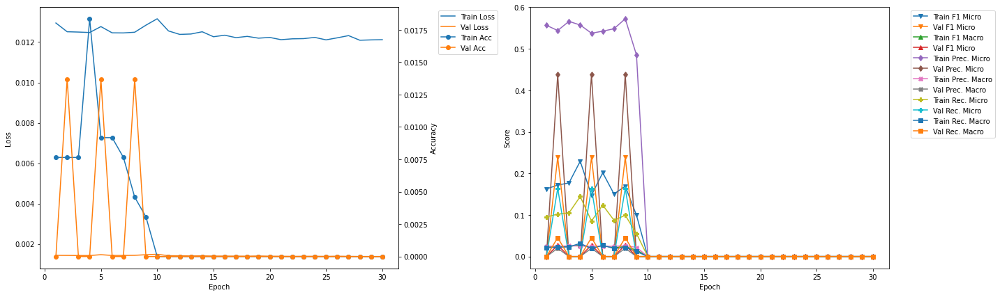

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.98
Train Loss: 0.0131 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0098 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0042 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.12 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0164 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0051 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0029 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.12
Train Loss: 0.0124 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

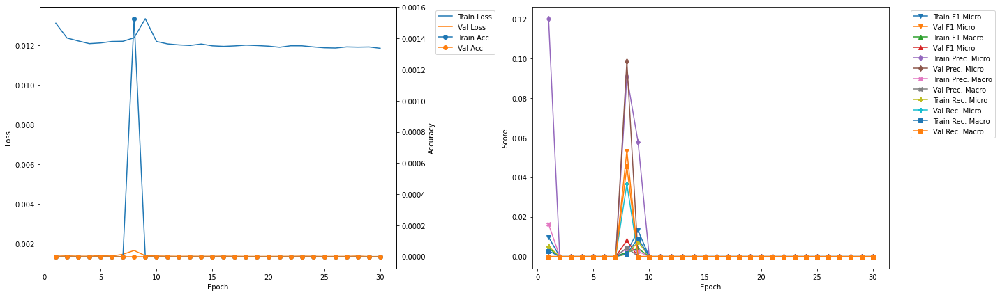

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.23
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0099 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0043 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.12 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0164 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0052 	Validation Recall Micro: 0.0
Train Recall Marco: 0.003 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.37
Train Loss: 0.0125 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

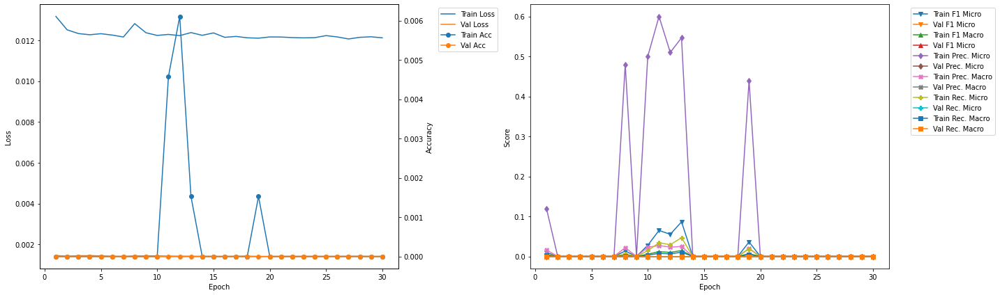

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.49
Train Loss: 0.0129 	Validation Loss: 0.0013
Train Accuracy: 0.0061 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0824 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0191 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.405 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0276 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0458 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0168 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.63
Train Loss: 0.0124 	Validation Loss: 0.0013
Train Accuracy: 0.0122 	Validation Accuracy: 0.0139
Train F1 Mirco: 0.1673 	Validation F1 Micro: 0.2857
Train F1 Marco: 0.0233 	Validation F1 Macro: 0.0303
Train Precision Mirco: 0.5385 	Validation Precision Micro: 0.5
Train Precision Marco: 0.0245 	Validation Precision Macro: 0.0227
Train Recall Mirco: 0.099 	Validation Recall Mic

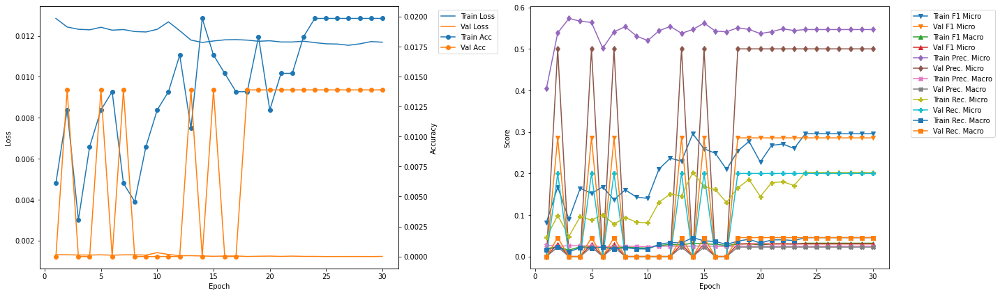

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 6 	Epoch: 5
Train Loss: 0.0128 	Validation Loss: 0.0013
Train Accuracy: 0.0046 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.1238 	Validation F1 Micro: 0.3588
Train F1 Marco: 0.0194 	Validation F1 Macro: 0.0356
Train Precision Mirco: 0.5371 	Validation Precision Micro: 0.6438
Train Precision Marco: 0.0244 	Validation Precision Macro: 0.0293
Train Recall Mirco: 0.07 	Validation Recall Micro: 0.2487
Train Recall Marco: 0.0161 	Validation Recall Macro: 0.0455


In [20]:
resnet50LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = resnet50LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet50LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0235 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0592 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0404 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1109 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1177 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0404 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0306 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.32
Train Loss: 0.0137 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

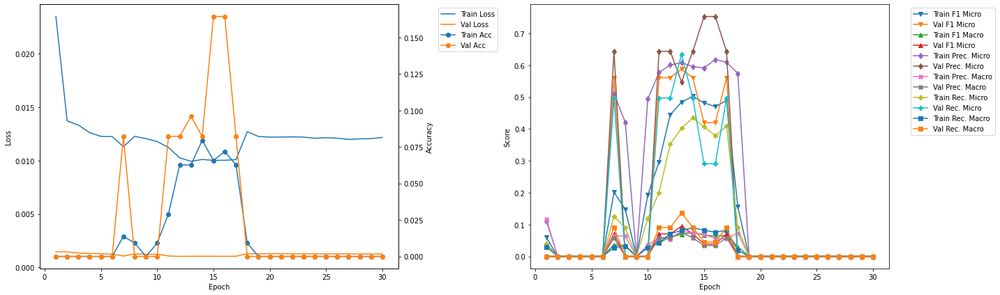

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.01
Train Loss: 0.0127 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0438 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0124 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.24 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0764 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0241 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0072 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.17
Train Loss: 0.0122 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Val

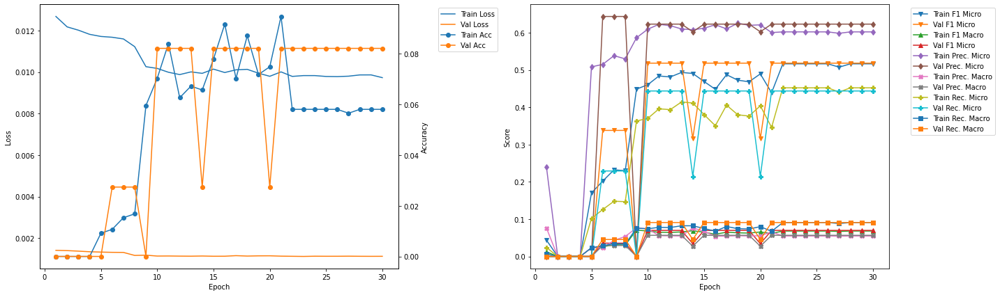

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 9.84
Train Loss: 0.0107 	Validation Loss: 0.0011
Train Accuracy: 0.052 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.3957 	Validation F1 Micro: 0.5263
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.5595 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0759 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.3061 	Validation Recall Micro: 0.4592
Train Recall Marco: 0.0655 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.0
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4714 	Validation F1 Micro: 0.5263
Train F1 Marco: 0.0633 	Validation F1 Macro: 0.0693
Train Precision Mirco: 0.6168 	Validation Precision Micro: 0.6164
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.056
Train Recall Mirco: 0.3815 	Val

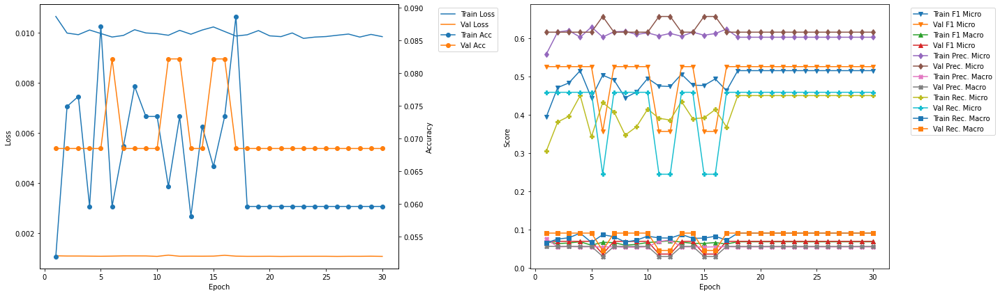

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.67
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0887 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4872 	Validation F1 Micro: 0.5379
Train F1 Marco: 0.0714 	Validation F1 Macro: 0.0901
Train Precision Mirco: 0.6201 	Validation Precision Micro: 0.5023
Train Precision Marco: 0.0755 	Validation Precision Macro: 0.0685
Train Recall Mirco: 0.4013 	Validation Recall Micro: 0.5789
Train Recall Marco: 0.0805 	Validation Recall Macro: 0.1364

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.83
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4878 	Validation F1 Micro: 0.506
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0669
Train Precision Mirco: 0.6061 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0711 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.4081 

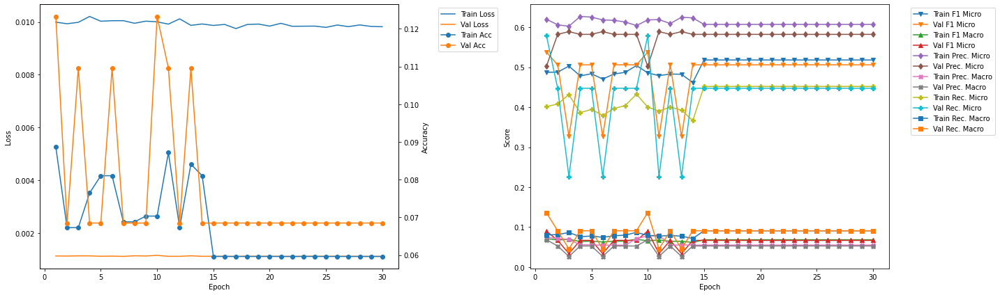

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.51
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4802 	Validation F1 Micro: 0.5115
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6099 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.396 	Validation Recall Micro: 0.4406
Train Recall Marco: 0.0782 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.67
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5037 	Validation F1 Micro: 0.5115
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6083 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4298 

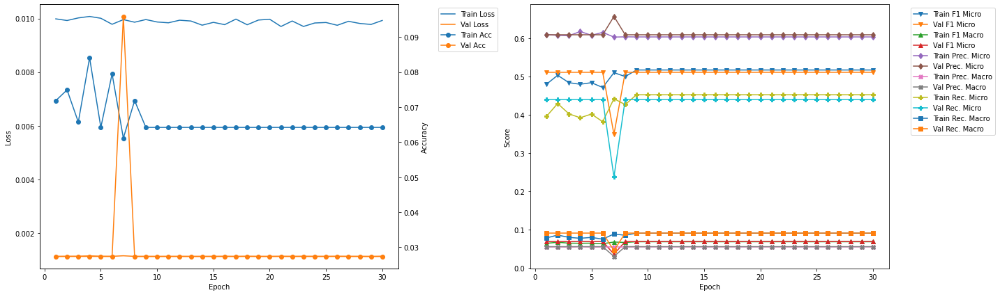

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.34
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4968 	Validation F1 Micro: 0.5559
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4222 	Validation Recall Micro: 0.4973
Train Recall Marco: 0.0854 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.5
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0719 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4704 	Validation F1 Micro: 0.5559
Train F1 Marco: 0.0665 	Validation F1 Macro: 0.0698
Train Precision Mirco: 0.6092 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0697 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.3831 

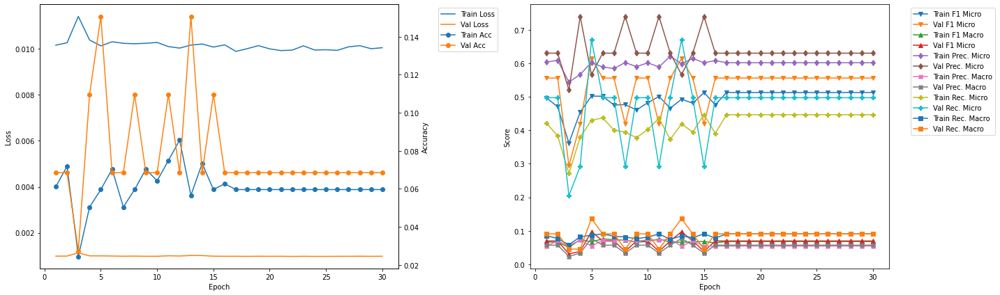

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 29.18
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.479 	Validation F1 Micro: 0.5159
Train F1 Marco: 0.0652 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.6173 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0559 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3913 	Validation Recall Micro: 0.4472
Train Recall Marco: 0.0784 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 29.34
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.5101 	Validation F1 Micro: 0.5159
Train F1 Marco: 0.0676 	Validation F1 Macro: 0.0685
Train Precision Mirco: 0.6036 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0547 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4416 	Va

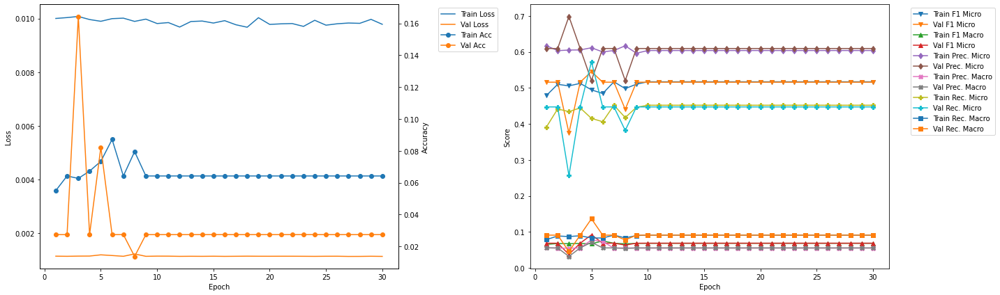

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.01
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0763 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4814 	Validation F1 Micro: 0.449
Train F1 Marco: 0.0693 	Validation F1 Macro: 0.0629
Train Precision Mirco: 0.6034 	Validation Precision Micro: 0.5347
Train Precision Marco: 0.0727 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4005 	Validation Recall Micro: 0.3869
Train Recall Marco: 0.0792 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.17
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0824 	Validation Accuracy: 0.0556
Train F1 Mirco: 0.4897 	Validation F1 Micro: 0.449
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0629
Train Precision Mirco: 0.6138 	Validation Precision Micro: 0.5347
Train Precision Marco: 0.0718 	Validation Precision Macro: 0.0486
Train Recall Mirco: 0.4073 	

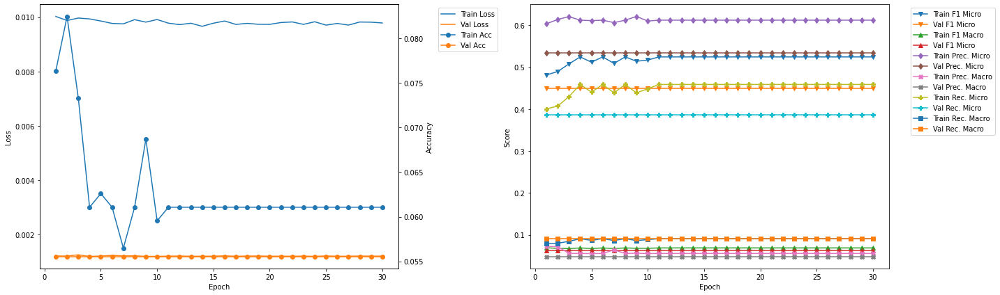

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.85
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0626 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5139 	Validation F1 Micro: 0.3768
Train F1 Marco: 0.0679 	Validation F1 Macro: 0.0381
Train Precision Mirco: 0.6054 	Validation Precision Micro: 0.7222
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.0328
Train Recall Mirco: 0.4464 	Validation Recall Micro: 0.2549
Train Recall Marco: 0.089 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 39.01
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0748 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4917 	Validation F1 Micro: 0.4943
Train F1 Marco: 0.0657 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.615 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0553 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.4096 	

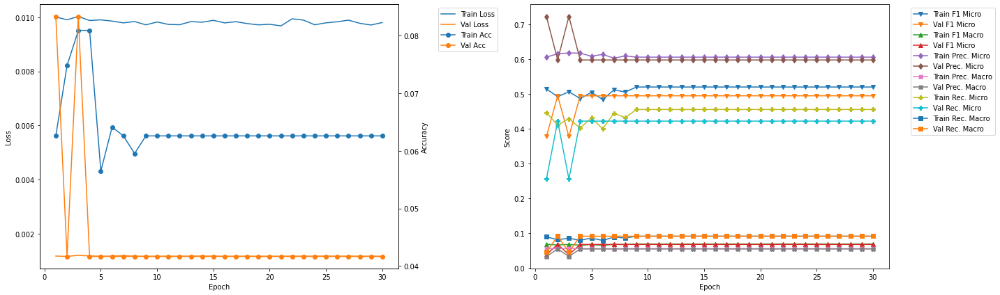

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 43.68
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0641 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4646 	Validation F1 Micro: 0.36
Train F1 Marco: 0.063 	Validation F1 Macro: 0.035
Train Precision Mirco: 0.6111 	Validation Precision Micro: 0.625
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0284
Train Recall Mirco: 0.3748 	Validation Recall Micro: 0.2528
Train Recall Marco: 0.0746 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.84
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0702 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4862 	Validation F1 Micro: 0.5342
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.0679
Train Precision Mirco: 0.622 	Validation Precision Micro: 0.5972
Train Precision Marco: 0.0557 	Validation Precision Macro: 0.0543
Train Recall Mirco: 0.3991 	Va

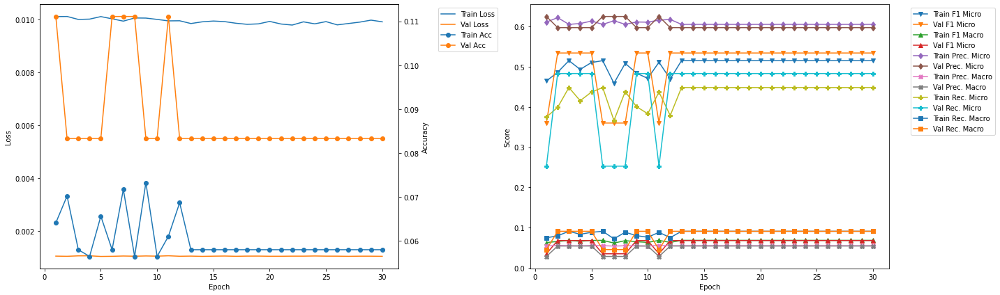

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 6 	Epoch: 5
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.0596 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.502 	Validation F1 Micro: 0.6139
Train F1 Marco: 0.0671 	Validation F1 Macro: 0.0975
Train Precision Mirco: 0.6025 	Validation Precision Micro: 0.5662
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0772
Train Recall Mirco: 0.4302 	Validation Recall Micro: 0.6703
Train Recall Marco: 0.0872 	Validation Recall Macro: 0.1364


In [21]:
resnet101LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = resnet101LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'resnet101LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.16
Train Loss: 0.0167 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0533 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0439 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1388 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1242 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.033 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0423 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.31
Train Loss: 0.0128 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0034 	Validation F1 Micro: 0.0
Train F1 Marco: 0.004 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1364 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1364 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0017 	Validation Recall Micro: 0.0
Train Recall 

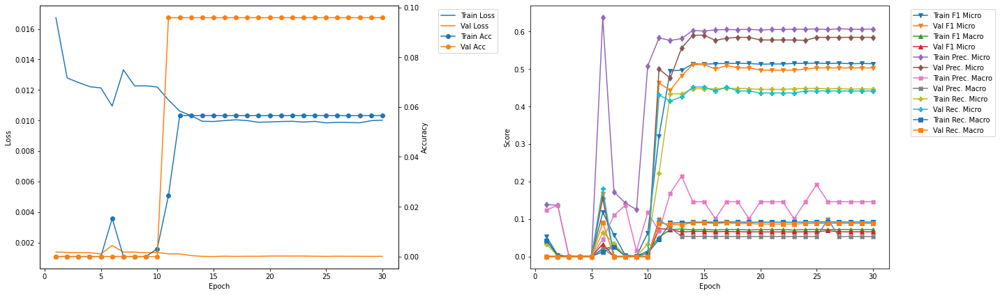

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 4.86
Train Loss: 0.0108 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4382 	Validation F1 Micro: 0.3662
Train F1 Marco: 0.069 	Validation F1 Macro: 0.0596
Train Precision Mirco: 0.5811 	Validation Precision Micro: 0.52
Train Precision Marco: 0.075 	Validation Precision Macro: 0.1423
Train Recall Mirco: 0.3517 	Validation Recall Micro: 0.2826
Train Recall Marco: 0.0731 	Validation Recall Macro: 0.0598

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.01
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0749 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.473 	Validation F1 Micro: 0.4893
Train F1 Marco: 0.0721 	Validation F1 Macro: 0.0652
Train Precision Mirco: 0.6071 	Validation Precision Micro: 0.5594
Train Precision Marco: 0.2596 	Validation Precision Macro: 0.0519
Train Recall Mirco: 0.3874 	Val

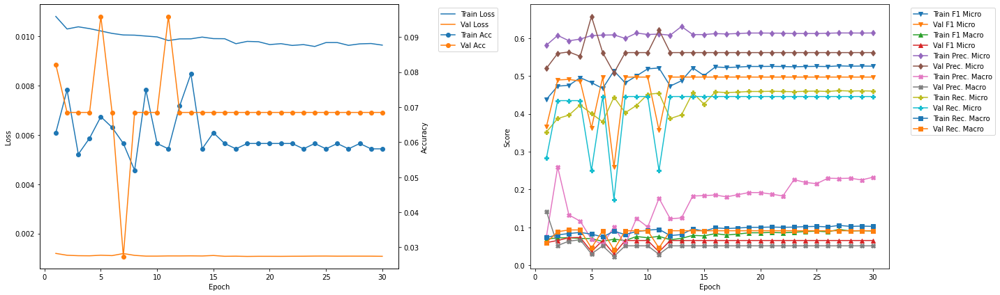

-------------------------------------------
FOLD 3
-------------------------------------------
Validation F1 Micro Score Increased (0.512048 --> 0.546547).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 9.53
Train Loss: 0.0103 	Validation Loss: 0.001
Train Accuracy: 0.0612 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4791 	Validation F1 Micro: 0.5465
Train F1 Marco: 0.0761 	Validation F1 Macro: 0.0921
Train Precision Mirco: 0.6029 	Validation Precision Micro: 0.619
Train Precision Marco: 0.1429 	Validation Precision Macro: 0.1015
Train Recall Mirco: 0.3975 	Validation Recall Micro: 0.4892
Train Recall Marco: 0.0831 	Validation Recall Macro: 0.1061

Validation F1 Micro Score Increased (0.546547 --> 0.547619).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 9.7
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5167 	Validation F1 Micro: 0.5476
Train F1 Marco: 0.0819 	Validation F1 Macro: 0.0953
Tra

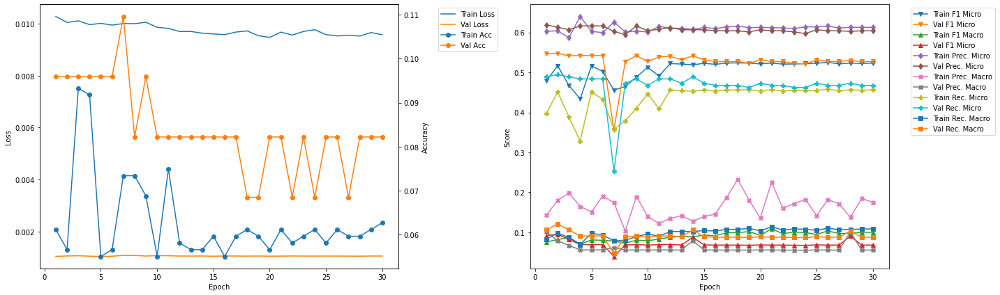

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 14.21
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4865 	Validation F1 Micro: 0.5163
Train F1 Marco: 0.0895 	Validation F1 Macro: 0.0764
Train Precision Mirco: 0.5992 	Validation Precision Micro: 0.5686
Train Precision Marco: 0.1518 	Validation Precision Macro: 0.0623
Train Recall Mirco: 0.4095 	Validation Recall Micro: 0.4728
Train Recall Marco: 0.094 	Validation Recall Macro: 0.0997

Epoch 2 	Learning Rate: 0.01 	Time (min): 14.37
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4721 	Validation F1 Micro: 0.521
Train F1 Marco: 0.0854 	Validation F1 Macro: 0.0678
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.58
Train Precision Marco: 0.1379 	Validation Precision Macro: 0.0553
Train Recall Mirco: 0.3863 	Val

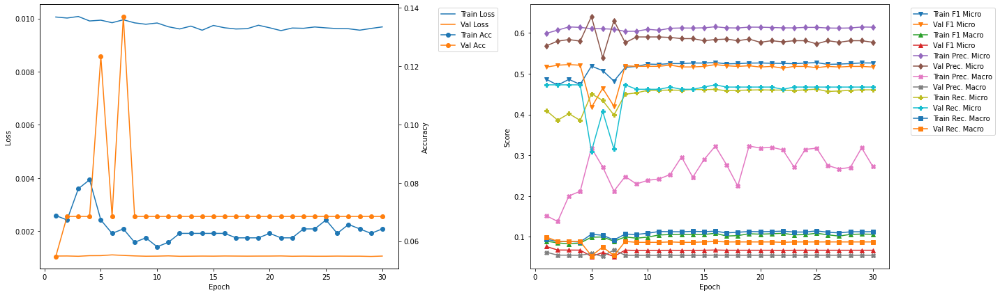

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 18.88
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0703 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.511 	Validation F1 Micro: 0.5239
Train F1 Marco: 0.0957 	Validation F1 Macro: 0.1204
Train Precision Mirco: 0.6094 	Validation Precision Micro: 0.6242
Train Precision Marco: 0.1892 	Validation Precision Macro: 0.1808
Train Recall Mirco: 0.44 	Validation Recall Micro: 0.4515
Train Recall Marco: 0.1029 	Validation Recall Macro: 0.1222

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.04
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.4988 	Validation F1 Micro: 0.5086
Train F1 Marco: 0.084 	Validation F1 Macro: 0.0934
Train Precision Mirco: 0.6083 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.1607 	Validation Precision Macro: 0.1128
Train Recall Mirco: 0.4227 	

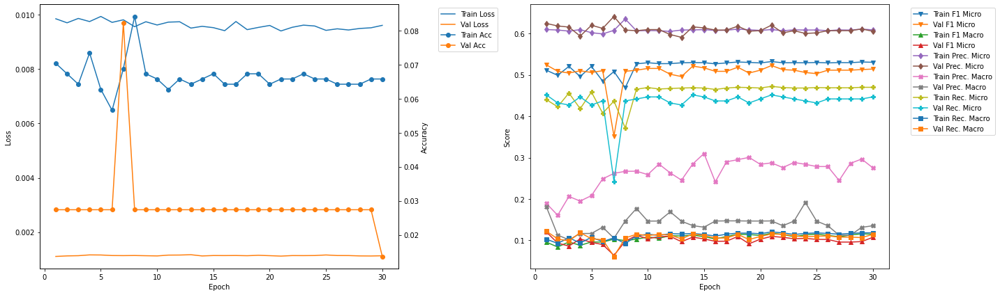

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.54
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5094 	Validation F1 Micro: 0.5143
Train F1 Marco: 0.1026 	Validation F1 Macro: 0.1076
Train Precision Mirco: 0.596 	Validation Precision Micro: 0.6081
Train Precision Marco: 0.211 	Validation Precision Macro: 0.1759
Train Recall Mirco: 0.4447 	Validation Recall Micro: 0.4455
Train Recall Marco: 0.1079 	Validation Recall Macro: 0.1151

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.7
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.516 	Validation F1 Micro: 0.5128
Train F1 Marco: 0.1006 	Validation F1 Macro: 0.1073
Train Precision Mirco: 0.607 	Validation Precision Micro: 0.604
Train Precision Marco: 0.1663 	Validation Precision Macro: 0.1755
Train Recall Mirco: 0.4487 	Va

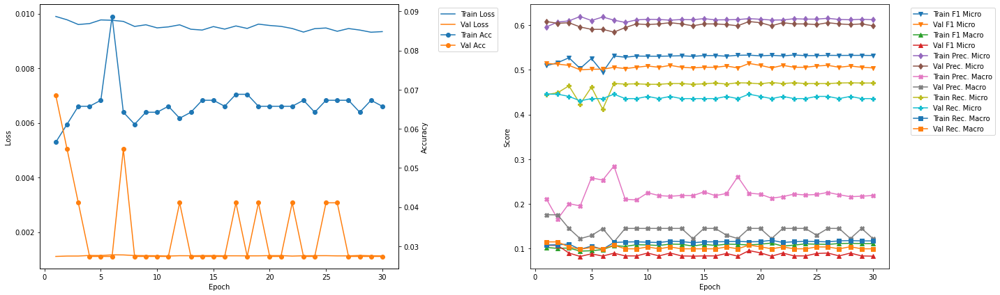

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.21
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0642 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.5232 	Validation F1 Micro: 0.5156
Train F1 Marco: 0.0997 	Validation F1 Macro: 0.0998
Train Precision Mirco: 0.6024 	Validation Precision Micro: 0.6107
Train Precision Marco: 0.2 	Validation Precision Macro: 0.1304
Train Recall Mirco: 0.4624 	Validation Recall Micro: 0.4461
Train Recall Marco: 0.1094 	Validation Recall Macro: 0.1093

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.37
Train Loss: 0.0096 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.496 	Validation F1 Micro: 0.5281
Train F1 Marco: 0.1028 	Validation F1 Macro: 0.1063
Train Precision Mirco: 0.6182 	Validation Precision Micro: 0.6184
Train Precision Marco: 0.224 	Validation Precision Macro: 0.1347
Train Recall Mirco: 0.4142 	V

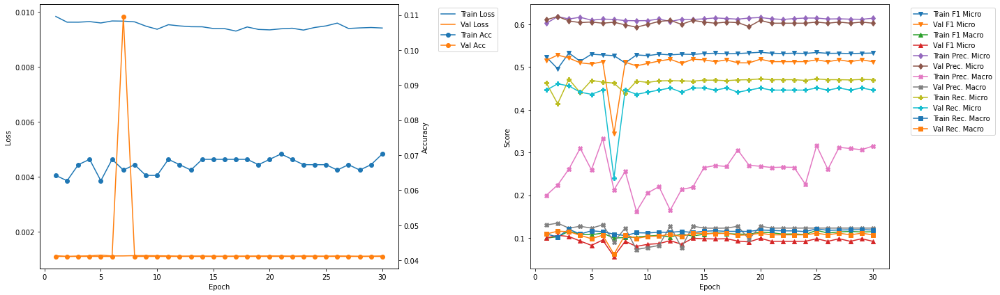

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 32.88
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0672 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5054 	Validation F1 Micro: 0.5208
Train F1 Marco: 0.1042 	Validation F1 Macro: 0.0942
Train Precision Mirco: 0.6066 	Validation Precision Micro: 0.6351
Train Precision Marco: 0.2577 	Validation Precision Macro: 0.09
Train Recall Mirco: 0.4331 	Validation Recall Micro: 0.4413
Train Recall Marco: 0.1069 	Validation Recall Macro: 0.1053

Epoch 2 	Learning Rate: 0.01 	Time (min): 33.03
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5279 	Validation F1 Micro: 0.5275
Train F1 Marco: 0.1066 	Validation F1 Macro: 0.0838
Train Precision Mirco: 0.603 	Validation Precision Micro: 0.6358
Train Precision Marco: 0.2588 	Validation Precision Macro: 0.0756
Train Recall Mirco: 0.4694 

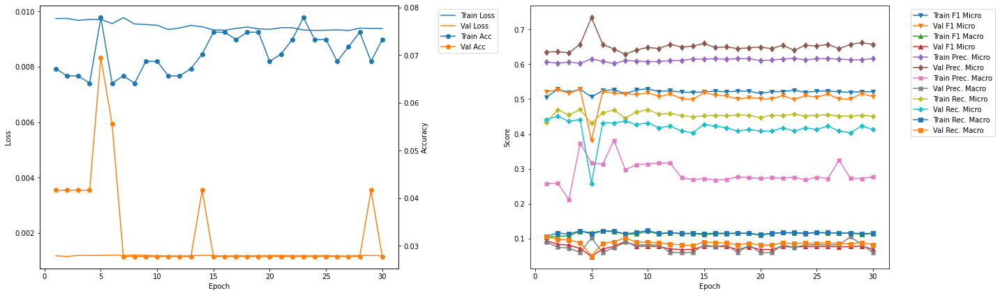

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.54
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0702 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.5027 	Validation F1 Micro: 0.5398
Train F1 Marco: 0.1051 	Validation F1 Macro: 0.1622
Train Precision Mirco: 0.6095 	Validation Precision Micro: 0.6376
Train Precision Marco: 0.2718 	Validation Precision Macro: 0.2617
Train Recall Mirco: 0.4278 	Validation Recall Micro: 0.468
Train Recall Marco: 0.1063 	Validation Recall Macro: 0.1511

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.7
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5129 	Validation F1 Micro: 0.3693
Train F1 Marco: 0.1079 	Validation F1 Macro: 0.1219
Train Precision Mirco: 0.6163 	Validation Precision Micro: 0.631
Train Precision Marco: 0.261 	Validation Precision Macro: 0.2085
Train Recall Mirco: 0.4392 	

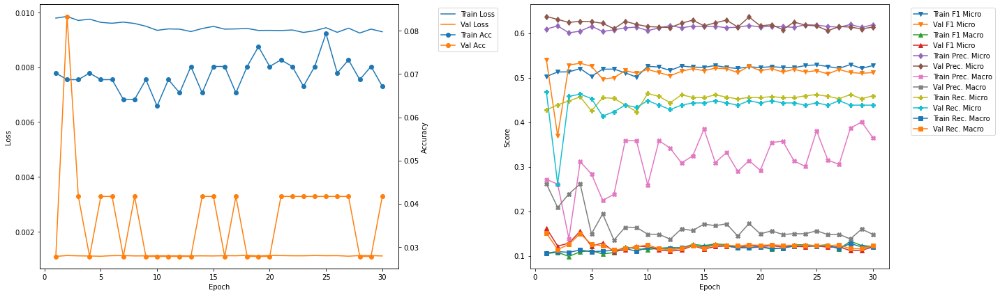

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.2
Train Loss: 0.0098 	Validation Loss: 0.001
Train Accuracy: 0.0534 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.505 	Validation F1 Micro: 0.5185
Train F1 Marco: 0.1132 	Validation F1 Macro: 0.0771
Train Precision Mirco: 0.6106 	Validation Precision Micro: 0.5714
Train Precision Marco: 0.2932 	Validation Precision Macro: 0.0678
Train Recall Mirco: 0.4305 	Validation Recall Micro: 0.4746
Train Recall Marco: 0.1116 	Validation Recall Macro: 0.1

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.36
Train Loss: 0.0095 	Validation Loss: 0.001
Train Accuracy: 0.0656 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.5324 	Validation F1 Micro: 0.5093
Train F1 Marco: 0.1195 	Validation F1 Macro: 0.0809
Train Precision Mirco: 0.6146 	Validation Precision Micro: 0.5655
Train Precision Marco: 0.3473 	Validation Precision Macro: 0.0673
Train Recall Mirco: 0.4695 	Va

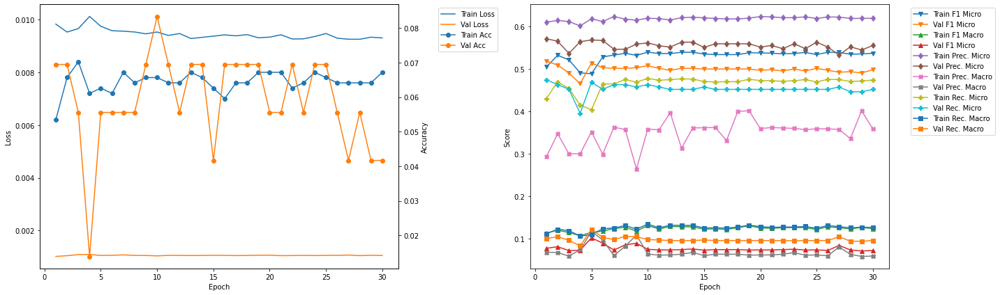

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 3 	Epoch: 2
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0566 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5167 	Validation F1 Micro: 0.5476
Train F1 Marco: 0.0819 	Validation F1 Macro: 0.0953
Train Precision Mirco: 0.6041 	Validation Precision Micro: 0.6133
Train Precision Marco: 0.1799 	Validation Precision Macro: 0.0788
Train Recall Mirco: 0.4514 	Validation Recall Micro: 0.4946
Train Recall Marco: 0.098 	Validation Recall Macro: 0.1212


In [22]:
densenet121LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = densenet121LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet121LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.18
Train Loss: 0.0172 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0011 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0128 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0032 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0007 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.35
Train Loss: 0.0128 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0056 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0045 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1786 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1818 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0029 	Validation Recall Micro: 0.0
Train Recal

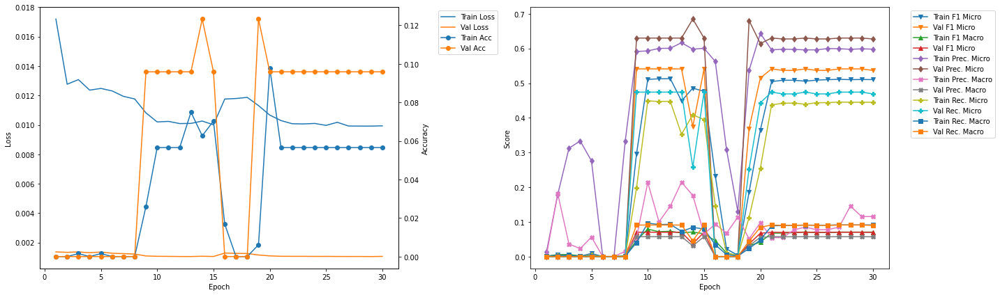

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.47
Train Loss: 0.0106 	Validation Loss: 0.0011
Train Accuracy: 0.0474 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4105 	Validation F1 Micro: 0.4709
Train F1 Marco: 0.0583 	Validation F1 Macro: 0.0627
Train Precision Mirco: 0.6046 	Validation Precision Micro: 0.5238
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0493
Train Recall Mirco: 0.3107 	Validation Recall Micro: 0.4278
Train Recall Marco: 0.0617 	Validation Recall Macro: 0.0872

Epoch 2 	Learning Rate: 0.01 	Time (min): 5.65
Train Loss: 0.0103 	Validation Loss: 0.0011
Train Accuracy: 0.0734 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4641 	Validation F1 Micro: 0.3651
Train F1 Marco: 0.0685 	Validation F1 Macro: 0.0354
Train Precision Mirco: 0.6083 	Validation Precision Micro: 0.6389
Train Precision Marco: 0.1 	Validation Precision Macro: 0.029
Train Recall Mirco: 0.3752 	Va

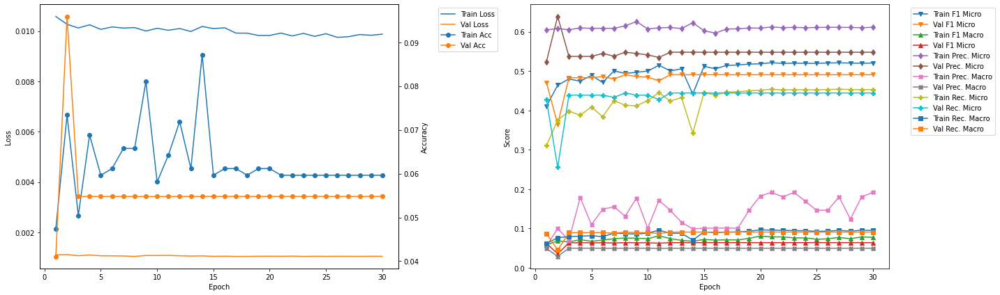

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 10.76
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0765 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4812 	Validation F1 Micro: 0.5282
Train F1 Marco: 0.0739 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6099 	Validation Precision Micro: 0.5973
Train Precision Marco: 0.091 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3974 	Validation Recall Micro: 0.4734
Train Recall Marco: 0.0836 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 10.94
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4827 	Validation F1 Micro: 0.5298
Train F1 Marco: 0.0688 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.599 	Validation Precision Micro: 0.6014
Train Precision Marco: 0.1904 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4042 	

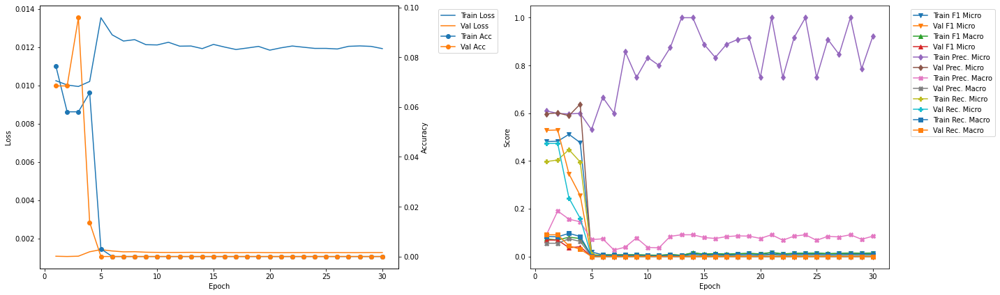

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 16.05
Train Loss: 0.0126 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0388 	Validation F1 Micro: 0.0102
Train F1 Marco: 0.0165 	Validation F1 Macro: 0.0152
Train Precision Mirco: 0.2357 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0998 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0211 	Validation Recall Micro: 0.0051
Train Recall Marco: 0.0098 	Validation Recall Macro: 0.0091

Epoch 2 	Learning Rate: 0.01 	Time (min): 16.23
Train Loss: 0.0122 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0136 	Validation F1 Micro: 0.0202
Train F1 Marco: 0.0144 	Validation F1 Macro: 0.026
Train Precision Mirco: 0.8 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.0731 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0068 	Validation Reca

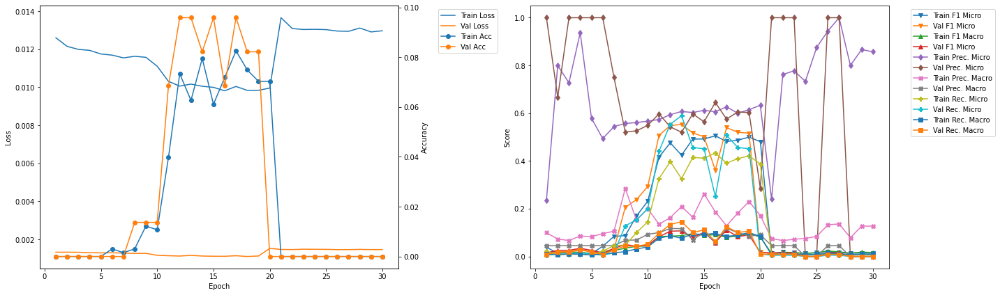

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 21.37
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0091 	Validation F1 Micro: 0.0193
Train F1 Marco: 0.0108 	Validation F1 Macro: 0.013
Train Precision Mirco: 0.8889 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0833 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0046 	Validation Recall Micro: 0.0098
Train Recall Marco: 0.0058 	Validation Recall Macro: 0.0076

Epoch 2 	Learning Rate: 0.01 	Time (min): 21.54
Train Loss: 0.013 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0103 	Validation F1 Micro: 0.0193
Train F1 Marco: 0.012 	Validation F1 Macro: 0.013
Train Precision Mirco: 0.9 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0852 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0052 	Validation Recall Mic

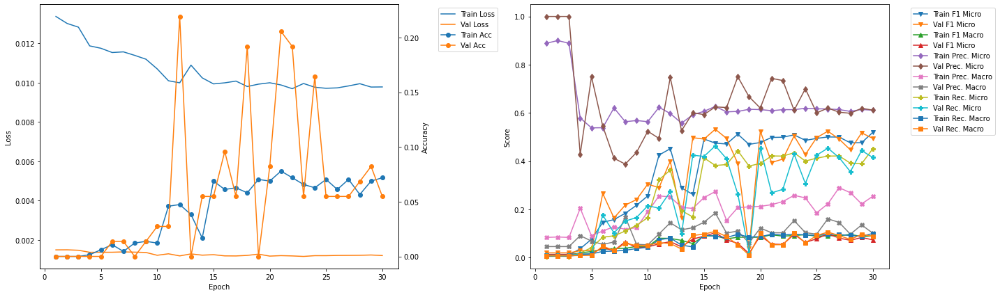

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 26.66
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0673 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4548 	Validation F1 Micro: 0.5444
Train F1 Marco: 0.0785 	Validation F1 Macro: 0.1026
Train Precision Mirco: 0.6162 	Validation Precision Micro: 0.6209
Train Precision Marco: 0.1793 	Validation Precision Macro: 0.1372
Train Recall Mirco: 0.3604 	Validation Recall Micro: 0.4847
Train Recall Marco: 0.0782 	Validation Recall Macro: 0.1126

Epoch 2 	Learning Rate: 0.01 	Time (min): 26.83
Train Loss: 0.0098 	Validation Loss: 0.0011
Train Accuracy: 0.0917 	Validation Accuracy: 0.1096
Train F1 Mirco: 0.4917 	Validation F1 Micro: 0.3663
Train F1 Marco: 0.0848 	Validation F1 Macro: 0.0613
Train Precision Mirco: 0.6218 	Validation Precision Micro: 0.6494
Train Precision Marco: 0.2011 	Validation Precision Macro: 0.0872
Train Recall Mirco: 0.40

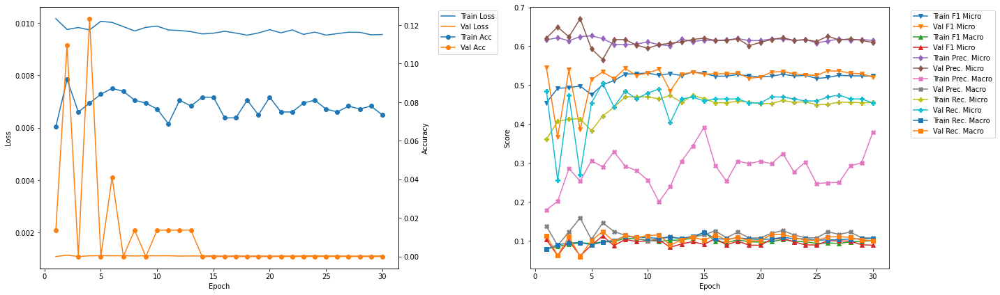

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.95
Train Loss: 0.0099 	Validation Loss: 0.0012
Train Accuracy: 0.0657 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4843 	Validation F1 Micro: 0.3823
Train F1 Marco: 0.1037 	Validation F1 Macro: 0.0614
Train Precision Mirco: 0.5777 	Validation Precision Micro: 0.6588
Train Precision Marco: 0.2742 	Validation Precision Macro: 0.1061
Train Recall Mirco: 0.4169 	Validation Recall Micro: 0.2692
Train Recall Marco: 0.1003 	Validation Recall Macro: 0.0598

Epoch 2 	Learning Rate: 0.01 	Time (min): 32.12
Train Loss: 0.0097 	Validation Loss: 0.0012
Train Accuracy: 0.0749 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.4895 	Validation F1 Micro: 0.5
Train F1 Marco: 0.1008 	Validation F1 Macro: 0.0841
Train Precision Mirco: 0.6098 	Validation Precision Micro: 0.6014
Train Precision Marco: 0.3541 	Validation Precision Macro: 0.123
Train Recall Mirco: 0.4089 	

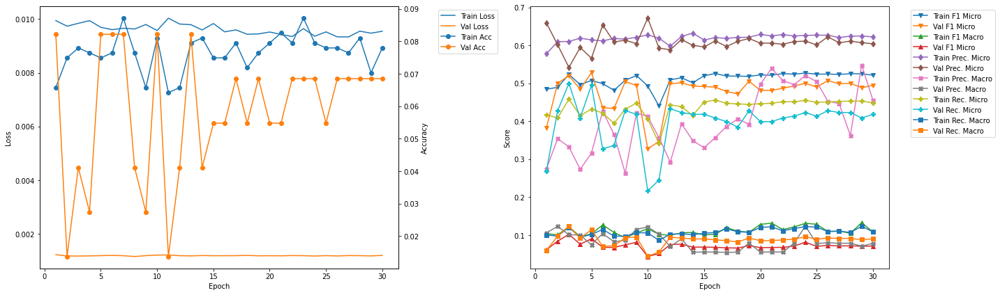

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 37.24
Train Loss: 0.0098 	Validation Loss: 0.0012
Train Accuracy: 0.0763 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.507 	Validation F1 Micro: 0.4802
Train F1 Marco: 0.1204 	Validation F1 Macro: 0.1129
Train Precision Mirco: 0.6234 	Validation Precision Micro: 0.627
Train Precision Marco: 0.4136 	Validation Precision Macro: 0.1927
Train Recall Mirco: 0.4272 	Validation Recall Micro: 0.3892
Train Recall Marco: 0.1122 	Validation Recall Macro: 0.1097

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.41
Train Loss: 0.0096 	Validation Loss: 0.0012
Train Accuracy: 0.0992 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.5038 	Validation F1 Micro: 0.5143
Train F1 Marco: 0.1204 	Validation F1 Macro: 0.1239
Train Precision Mirco: 0.6326 	Validation Precision Micro: 0.6122
Train Precision Marco: 0.3895 	Validation Precision Macro: 0.2267
Train Recall Mirco: 0.4186

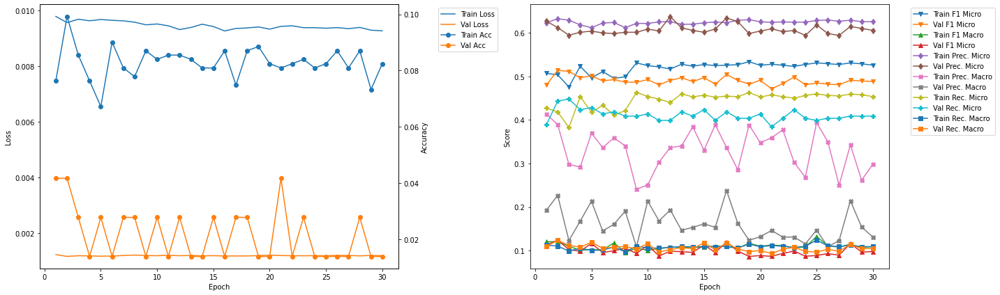

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 42.52
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0763 	Validation Accuracy: 0.125
Train F1 Mirco: 0.501 	Validation F1 Micro: 0.5465
Train F1 Marco: 0.1142 	Validation F1 Macro: 0.1171
Train Precision Mirco: 0.6102 	Validation Precision Micro: 0.6547
Train Precision Marco: 0.2637 	Validation Precision Macro: 0.2059
Train Recall Mirco: 0.425 	Validation Recall Micro: 0.4691
Train Recall Marco: 0.1079 	Validation Recall Macro: 0.1124

Epoch 2 	Learning Rate: 0.01 	Time (min): 42.7
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0809 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4867 	Validation F1 Micro: 0.4865
Train F1 Marco: 0.0965 	Validation F1 Macro: 0.0962
Train Precision Mirco: 0.6201 	Validation Precision Micro: 0.7059
Train Precision Marco: 0.3422 	Validation Precision Macro: 0.1989
Train Recall Mirco: 0.4005 	V

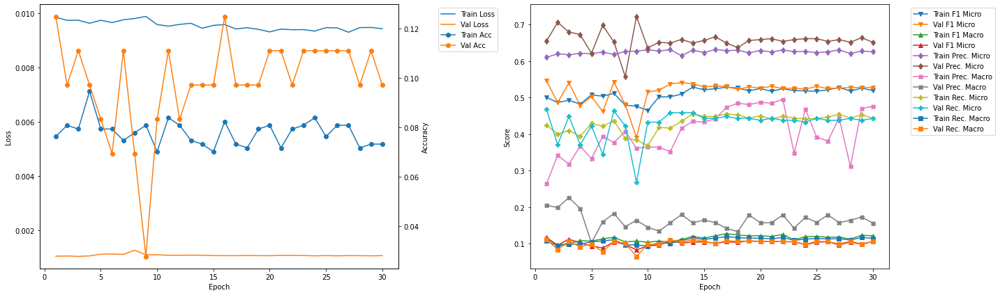

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 47.8
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0672 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4858 	Validation F1 Micro: 0.5325
Train F1 Marco: 0.1166 	Validation F1 Macro: 0.094
Train Precision Mirco: 0.6133 	Validation Precision Micro: 0.6187
Train Precision Marco: 0.3487 	Validation Precision Macro: 0.1217
Train Recall Mirco: 0.4022 	Validation Recall Micro: 0.4674
Train Recall Marco: 0.1057 	Validation Recall Macro: 0.1004

Epoch 2 	Learning Rate: 0.01 	Time (min): 47.98
Train Loss: 0.0097 	Validation Loss: 0.0011
Train Accuracy: 0.0824 	Validation Accuracy: 0.125
Train F1 Mirco: 0.4839 	Validation F1 Micro: 0.5266
Train F1 Marco: 0.1334 	Validation F1 Macro: 0.0713
Train Precision Mirco: 0.6234 	Validation Precision Micro: 0.6222
Train Precision Marco: 0.4317 	Validation Precision Macro: 0.0798
Train Recall Mirco: 0.3953 

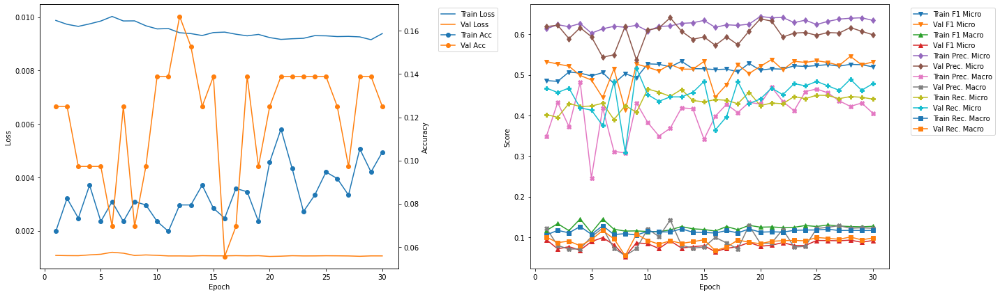

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 4 	Epoch: 13
Train Loss: 0.0102 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4242 	Validation F1 Micro: 0.5529
Train F1 Marco: 0.0872 	Validation F1 Macro: 0.1073
Train Precision Mirco: 0.6074 	Validation Precision Micro: 0.5204
Train Precision Marco: 0.2092 	Validation Precision Macro: 0.1164
Train Recall Mirco: 0.3259 	Validation Recall Micro: 0.5897
Train Recall Marco: 0.0764 	Validation Recall Macro: 0.1455


In [23]:
densenet169LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = densenet169LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet169LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.19
Train Loss: 0.0169 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0627 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0468 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1384 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1336 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0405 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0365 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.38
Train Loss: 0.0124 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

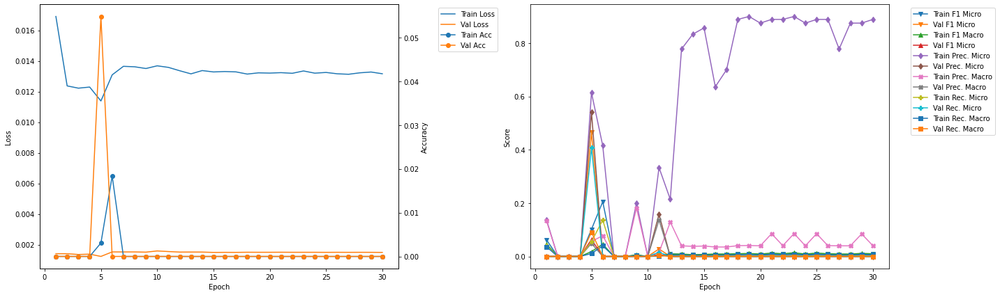

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.92
Train Loss: 0.0139 	Validation Loss: 0.0017
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0394
Train F1 Marco: 0.0027 	Validation F1 Macro: 0.0277
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.2
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.1818
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0219
Train Recall Marco: 0.0014 	Validation Recall Macro: 0.0155

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.11
Train Loss: 0.014 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0045 	Validation F1 Micro: 0.0451
Train F1 Marco: 0.0021 	Validation F1 Macro: 0.0167
Train Precision Mirco: 0.1739 	Validation Precision Micro: 0.0723
Train Precision Marco: 0.1818 	Validation Precision Macro: 0.0682
Train Recall Mirco: 0.0023 	Validation Recall

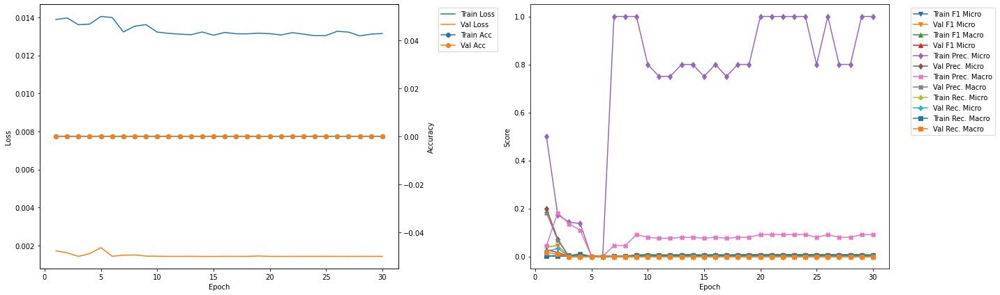

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.63
Train Loss: 0.0151 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0603 	Validation F1 Micro: 0.0093
Train F1 Marco: 0.0457 	Validation F1 Macro: 0.013
Train Precision Mirco: 0.177 	Validation Precision Micro: 1.0
Train Precision Marco: 0.1791 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0363 	Validation Recall Micro: 0.0047
Train Recall Marco: 0.0365 	Validation Recall Macro: 0.0076

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.82
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0012 	Validation F1 Micro: 0.0093
Train F1 Marco: 0.004 	Validation F1 Macro: 0.013
Train Precision Mirco: 0.5 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0006 	Validation Recall Mic

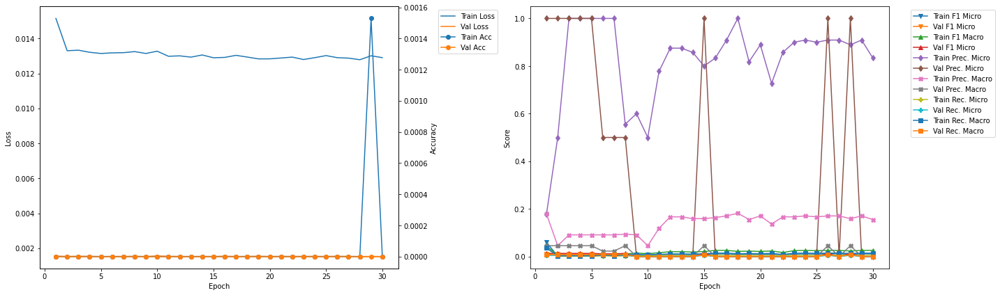

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.36
Train Loss: 0.0201 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.092 	Validation F1 Micro: 0.0112
Train F1 Marco: 0.072 	Validation F1 Macro: 0.0101
Train Precision Mirco: 0.1615 	Validation Precision Micro: 0.3333
Train Precision Marco: 0.2443 	Validation Precision Macro: 0.0152
Train Recall Mirco: 0.0643 	Validation Recall Micro: 0.0057
Train Recall Marco: 0.0605 	Validation Recall Macro: 0.0076

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.54
Train Loss: 0.0136 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.009 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0165 	Validation F1 Macro: 0.0
Train Precision Mirco: 1.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1364 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0045 	Validation Recall Micro: 0

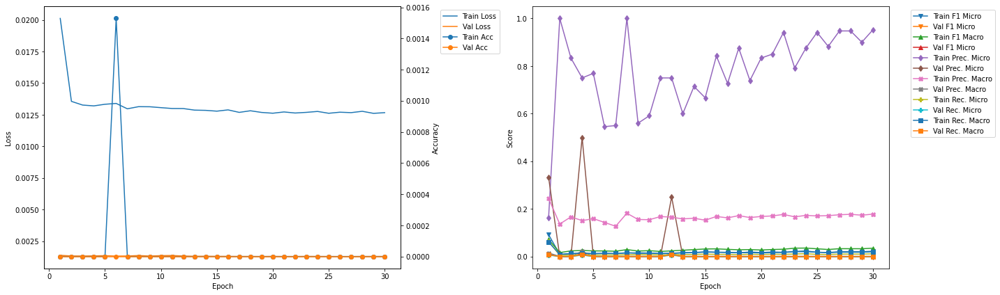

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.07
Train Loss: 0.0138 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0497 	Validation F1 Micro: 0.0199
Train F1 Marco: 0.0436 	Validation F1 Macro: 0.0234
Train Precision Mirco: 0.3287 	Validation Precision Micro: 0.5
Train Precision Marco: 0.2211 	Validation Precision Macro: 0.0682
Train Recall Mirco: 0.0269 	Validation Recall Micro: 0.0102
Train Recall Marco: 0.0337 	Validation Recall Macro: 0.0141

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.26
Train Loss: 0.0129 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.018 	Validation F1 Micro: 0.0101
Train F1 Marco: 0.0311 	Validation F1 Macro: 0.0152
Train Precision Mirco: 0.6667 	Validation Precision Micro: 1.0
Train Precision Marco: 0.2992 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0091 	Validation Reca

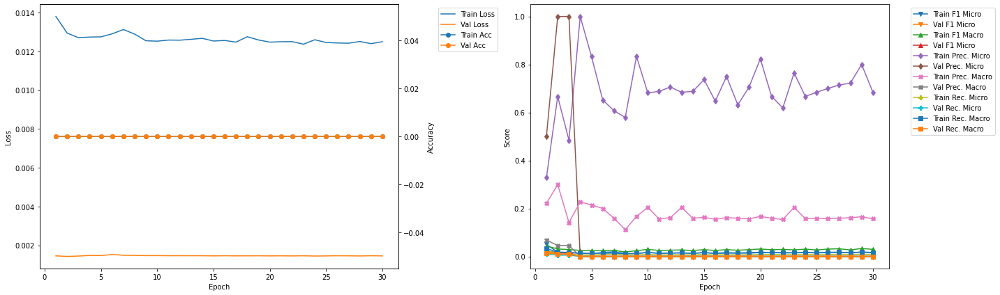

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.8
Train Loss: 0.0143 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0721 	Validation F1 Micro: 0.0099
Train F1 Marco: 0.0466 	Validation F1 Macro: 0.0114
Train Precision Mirco: 0.2892 	Validation Precision Micro: 0.5
Train Precision Marco: 0.2622 	Validation Precision Macro: 0.0227
Train Recall Mirco: 0.0412 	Validation Recall Micro: 0.005
Train Recall Marco: 0.0297 	Validation Recall Macro: 0.0076

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.99
Train Loss: 0.0128 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0181 	Validation F1 Micro: 0.0291
Train F1 Marco: 0.0302 	Validation F1 Macro: 0.0227
Train Precision Mirco: 0.7619 	Validation Precision Micro: 0.5
Train Precision Marco: 0.1667 	Validation Precision Macro: 0.0227
Train Recall Mirco: 0.0092 	Validation Recal

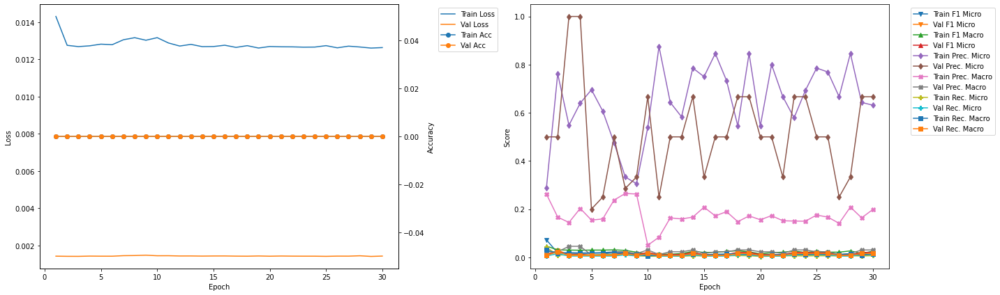

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.52
Train Loss: 0.0144 	Validation Loss: 0.0014
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0531 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0297 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.2587 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1471 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0296 	Validation Recall Micro: 0.0
Train Recall Marco: 0.02 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.71
Train Loss: 0.0129 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0146 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0208 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.65 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1197 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0074 	Validation Recall Micro: 0.0
Train Reca

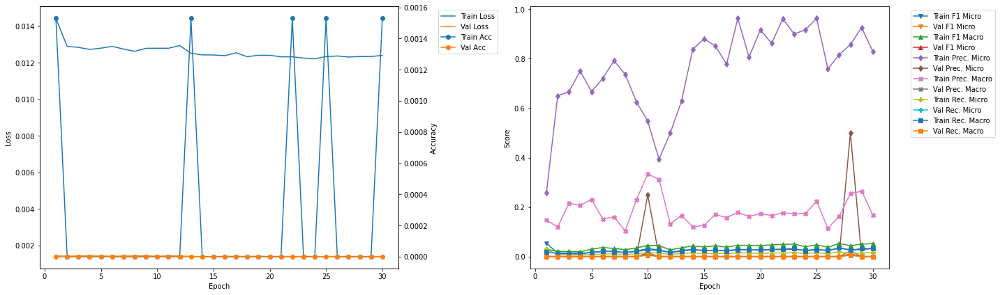

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 40.24
Train Loss: 0.0139 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.08 	Validation F1 Micro: 0.0724
Train F1 Marco: 0.0597 	Validation F1 Macro: 0.0639
Train Precision Mirco: 0.345 	Validation Precision Micro: 0.381
Train Precision Marco: 0.2426 	Validation Precision Macro: 0.2273
Train Recall Mirco: 0.0452 	Validation Recall Micro: 0.04
Train Recall Marco: 0.0417 	Validation Recall Macro: 0.0416

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.43
Train Loss: 0.0127 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0169 	Validation F1 Micro: 0.0488
Train F1 Marco: 0.0325 	Validation F1 Macro: 0.0325
Train Precision Mirco: 0.5 	Validation Precision Micro: 1.0
Train Precision Marco: 0.2727 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0086 	Validation Recall Mi

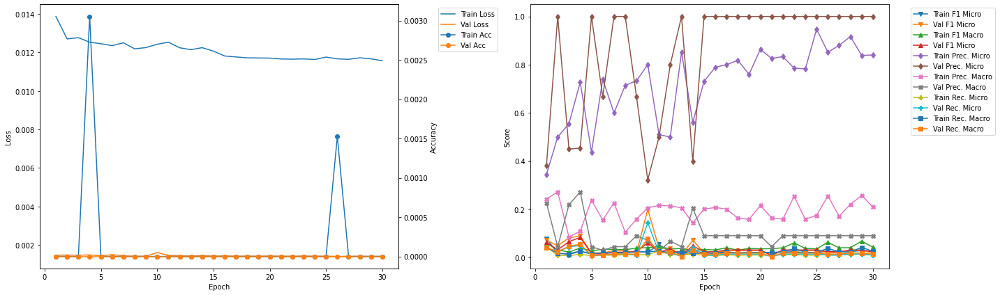

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.95
Train Loss: 0.0131 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0851 	Validation F1 Micro: 0.0196
Train F1 Marco: 0.0496 	Validation F1 Macro: 0.0318
Train Precision Mirco: 0.4049 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.2441 	Validation Precision Macro: 0.0909
Train Recall Mirco: 0.0475 	Validation Recall Micro: 0.01
Train Recall Marco: 0.0334 	Validation Recall Macro: 0.0202

Epoch 2 	Learning Rate: 0.01 	Time (min): 46.14
Train Loss: 0.0119 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0214 	Validation F1 Micro: 0.0196
Train F1 Marco: 0.039 	Validation F1 Macro: 0.0318
Train Precision Mirco: 0.6786 	Validation Precision Micro: 0.6667
Train Precision Marco: 0.1515 	Validation Precision Macro: 0.0909
Train Recall Mirco: 0.0109 	Validation 

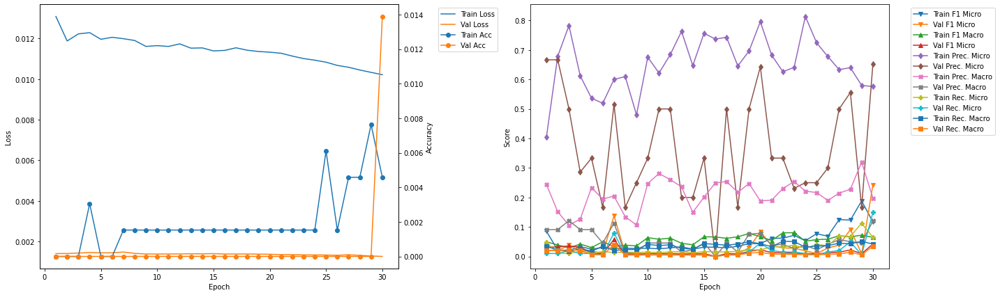

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 51.67
Train Loss: 0.013 	Validation Loss: 0.0013
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0799 	Validation F1 Micro: 0.0686
Train F1 Marco: 0.0565 	Validation F1 Macro: 0.0808
Train Precision Mirco: 0.3175 	Validation Precision Micro: 0.875
Train Precision Marco: 0.2196 	Validation Precision Macro: 0.1667
Train Recall Mirco: 0.0457 	Validation Recall Micro: 0.0357
Train Recall Marco: 0.0355 	Validation Recall Macro: 0.0654

Epoch 2 	Learning Rate: 0.01 	Time (min): 51.86
Train Loss: 0.0121 	Validation Loss: 0.0013
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0268 	Validation F1 Micro: 0.0099
Train F1 Marco: 0.039 	Validation F1 Macro: 0.0114
Train Precision Mirco: 0.5854 	Validation Precision Micro: 0.1667
Train Precision Marco: 0.2011 	Validation Precision Macro: 0.0114
Train Recall Mirco: 0.0137 	Vali

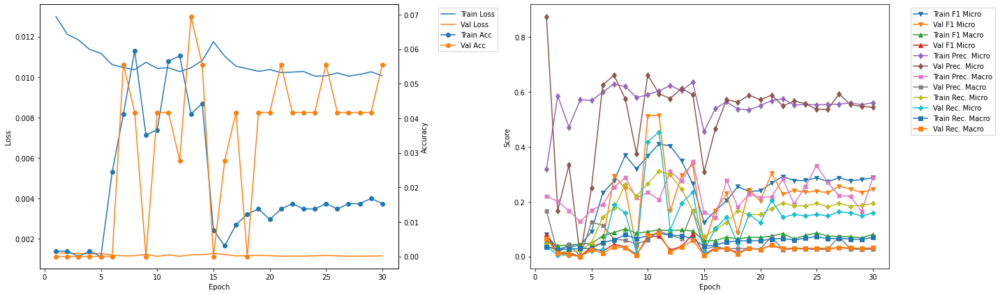

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 10 	Epoch: 11
Train Loss: 0.0105 	Validation Loss: 0.0012
Train Accuracy: 0.0565 	Validation Accuracy: 0.0417
Train F1 Mirco: 0.4103 	Validation F1 Micro: 0.5145
Train F1 Marco: 0.0973 	Validation F1 Macro: 0.0758
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.5933
Train Precision Marco: 0.2063 	Validation Precision Macro: 0.0929
Train Recall Mirco: 0.3107 	Validation Recall Micro: 0.4541
Train Recall Marco: 0.0846 	Validation Recall Macro: 0.0858


In [24]:
densenet201LSTM_700_1_0_best = Kfold_train_CNN_RNN(model = densenet201LSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'densenet201LSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.19
Train Loss: 0.0173 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0479 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0316 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1059 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1007 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.031 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0256 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.38
Train Loss: 0.0124 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

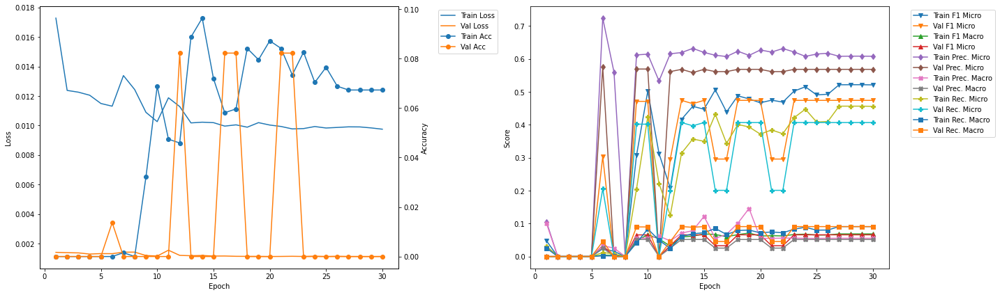

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 5.93
Train Loss: 0.0102 	Validation Loss: 0.0011
Train Accuracy: 0.0657 	Validation Accuracy: 0.0274
Train F1 Mirco: 0.475 	Validation F1 Micro: 0.2672
Train F1 Marco: 0.0642 	Validation F1 Macro: 0.0283
Train Precision Mirco: 0.6095 	Validation Precision Micro: 0.4521
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0205
Train Recall Mirco: 0.3892 	Validation Recall Micro: 0.1897
Train Recall Marco: 0.0781 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.474286 --> 0.493750).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.15
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0581 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.5147 	Validation F1 Micro: 0.4938
Train F1 Marco: 0.0748 	Validation F1 Macro: 0.0618
Train Precision Mirco: 0.5998 	Validation Precision Micro: 0.5411
Train Precisio

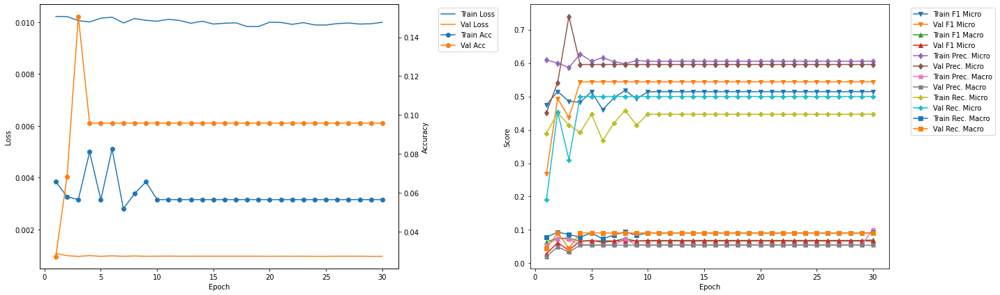

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 11.67
Train Loss: 0.0101 	Validation Loss: 0.001
Train Accuracy: 0.078 	Validation Accuracy: 0.0411
Train F1 Mirco: 0.4829 	Validation F1 Micro: 0.5378
Train F1 Marco: 0.065 	Validation F1 Macro: 0.0688
Train Precision Mirco: 0.6169 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.3967 	Validation Recall Micro: 0.4811
Train Recall Marco: 0.0792 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 11.86
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0642 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.5073 	Validation F1 Micro: 0.3721
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0361
Train Precision Mirco: 0.61 	Validation Precision Micro: 0.6575
Train Precision Marco: 0.0552 	Validation Precision Macro: 0.0299
Train Recall Mirco: 0.4342 	Va

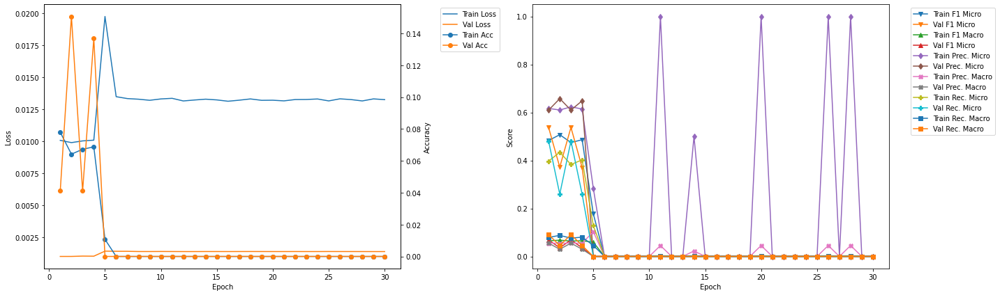

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 17.36
Train Loss: 0.0152 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0538 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0329 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1697 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1164 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.032 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0243 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 17.55
Train Loss: 0.0132 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0026 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0227 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Recall 

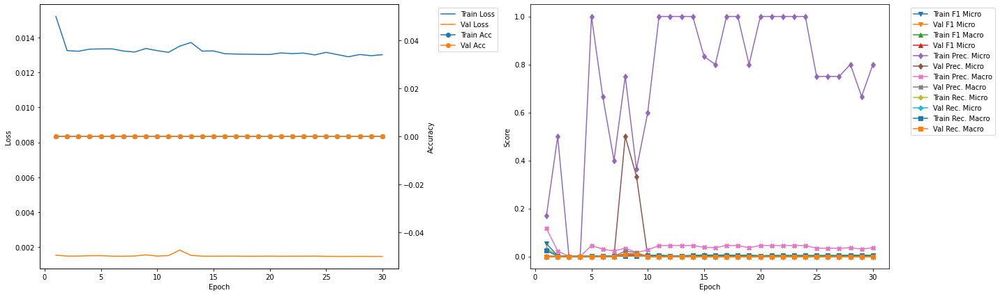

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 23.05
Train Loss: 0.0148 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0558 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0364 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1752 	Validation Precision Micro: 0.0
Train Precision Marco: 0.14 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0332 	Validation Recall Micro: 0.0
Train Recall Marco: 0.046 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 23.23
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0023 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0026 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0227 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0011 	Validation Recall Micro: 0.0
Train Recall Ma

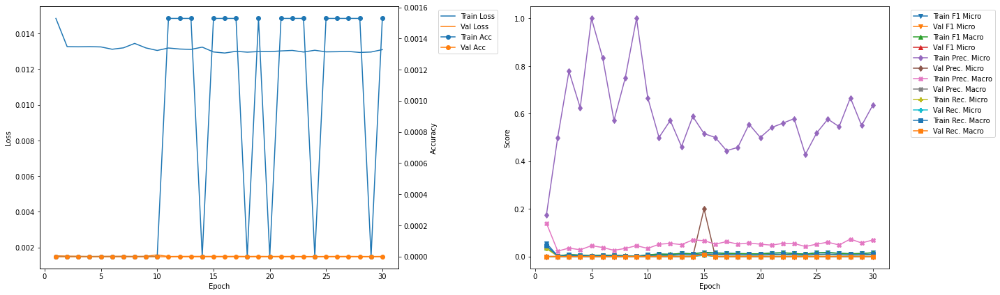

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 28.71
Train Loss: 0.0193 	Validation Loss: 0.0016
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0574 	Validation F1 Micro: 0.0488
Train F1 Marco: 0.0448 	Validation F1 Macro: 0.0249
Train Precision Mirco: 0.1432 	Validation Precision Micro: 0.3333
Train Precision Marco: 0.1457 	Validation Precision Macro: 0.0584
Train Recall Mirco: 0.0359 	Validation Recall Micro: 0.0263
Train Recall Marco: 0.0336 	Validation Recall Macro: 0.0253

Epoch 2 	Learning Rate: 0.01 	Time (min): 28.9
Train Loss: 0.0137 	Validation Loss: 0.0015
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.009 	Validation F1 Micro: 0.0311
Train F1 Marco: 0.0083 	Validation F1 Macro: 0.0256
Train Precision Mirco: 0.2759 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0568 	Validation Precision Macro: 0.0909
Train Recall Mirco: 0.0046 	Validat

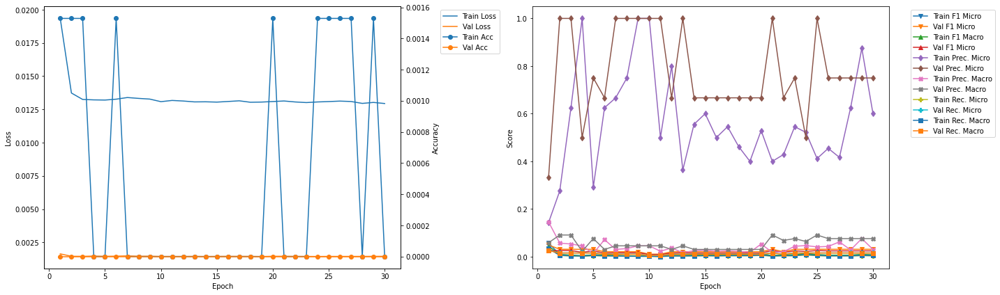

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 34.39
Train Loss: 0.0155 	Validation Loss: 0.0015
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0601 	Validation F1 Micro: 0.0104
Train F1 Marco: 0.044 	Validation F1 Macro: 0.0083
Train Precision Mirco: 0.1593 	Validation Precision Micro: 0.5
Train Precision Marco: 0.1816 	Validation Precision Macro: 0.0227
Train Recall Mirco: 0.037 	Validation Recall Micro: 0.0052
Train Recall Marco: 0.0327 	Validation Recall Macro: 0.0051

Epoch 2 	Learning Rate: 0.01 	Time (min): 34.58
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0015 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0101 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0104 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0515 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0051 	Validation Recall Micr

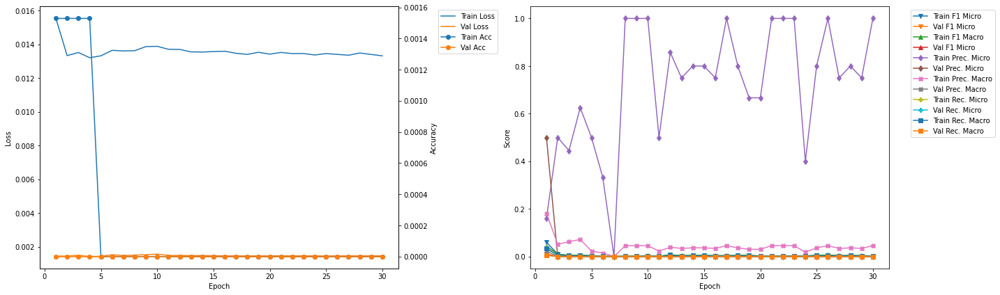

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 40.07
Train Loss: 0.0155 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0564 	Validation F1 Micro: 0.0092
Train F1 Marco: 0.036 	Validation F1 Macro: 0.0083
Train Precision Mirco: 0.1406 	Validation Precision Micro: 1.0
Train Precision Marco: 0.13 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0353 	Validation Recall Micro: 0.0046
Train Recall Marco: 0.0259 	Validation Recall Macro: 0.0045

Epoch 2 	Learning Rate: 0.01 	Time (min): 40.26
Train Loss: 0.0135 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0046 	Validation F1 Micro: 0.0092
Train F1 Marco: 0.0054 	Validation F1 Macro: 0.0083
Train Precision Mirco: 0.8 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0364 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0023 	Validation Recall Mi

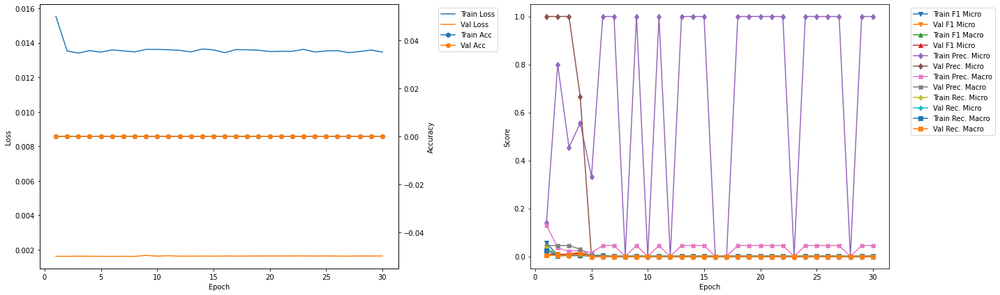

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 45.74
Train Loss: 0.0148 	Validation Loss: 0.0016
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0197
Train F1 Marco: 0.0 	Validation F1 Macro: 0.014
Train Precision Mirco: 0.0 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.01
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0083

Epoch 2 	Learning Rate: 0.01 	Time (min): 45.92
Train Loss: 0.0136 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0011 	Validation F1 Micro: 0.0099
Train F1 Marco: 0.0015 	Validation F1 Macro: 0.0076
Train Precision Mirco: 1.0 	Validation Precision Micro: 1.0
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0455
Train Recall Mirco: 0.0006 	Validation Recall Micro: 0.005
Train R

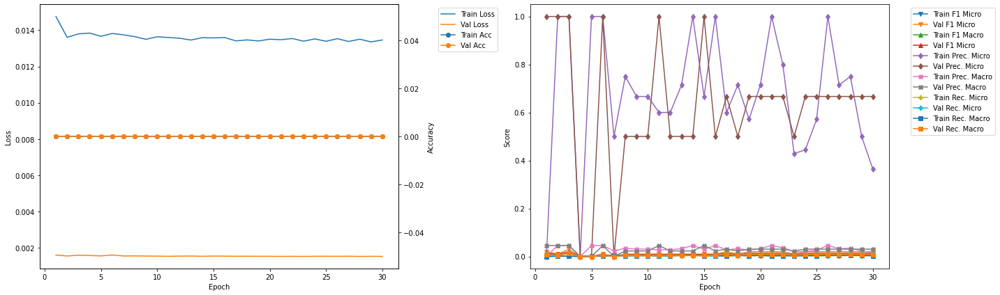

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 51.41
Train Loss: 0.0145 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0068 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0068 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.5 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0227 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0034 	Validation Recall Micro: 0.0
Train Recall Marco: 0.004 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 51.6
Train Loss: 0.0136 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0034 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0038 	Validation F1 Macro: 0.0
Train Precision Mirco: 1.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0455 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0017 	Validation Recall Micro: 0.0
Train Recall Mar

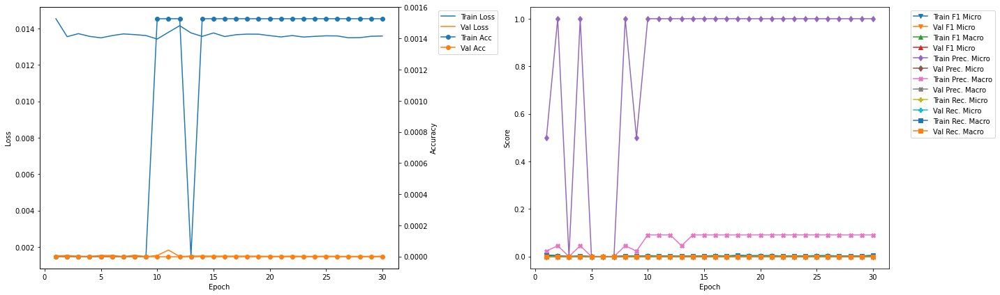

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 2 	Epoch: 4
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.081 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4825 	Validation F1 Micro: 0.5438
Train F1 Marco: 0.0656 	Validation F1 Macro: 0.067
Train Precision Mirco: 0.6273 	Validation Precision Micro: 0.5959
Train Precision Marco: 0.0564 	Validation Precision Macro: 0.0542
Train Recall Mirco: 0.392 	Validation Recall Micro: 0.5
Train Recall Marco: 0.0787 	Validation Recall Macro: 0.0909


In [25]:
vgg11bnLSTM_700_1_0_best = Kfold_train_CNN_RNN(model = vgg11bnLSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg11bnLSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.21
Train Loss: 0.0169 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0526 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0369 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1136 	Validation Precision Micro: 0.0
Train Precision Marco: 0.1122 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0342 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0288 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.41
Train Loss: 0.0127 	Validation Loss: 0.0013
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	V

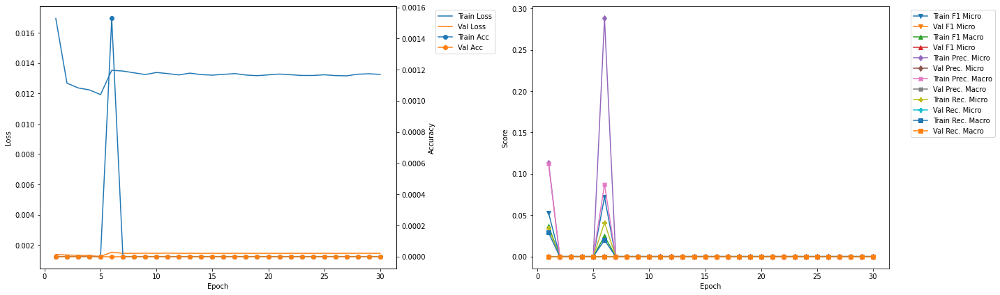

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.29
Train Loss: 0.0136 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.49
Train Loss: 0.0135 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

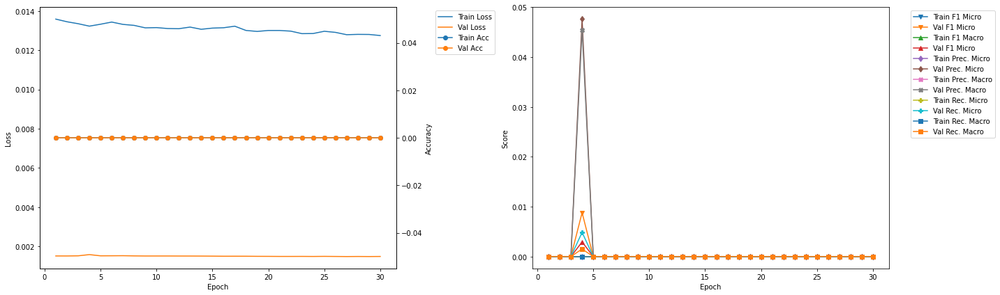

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.39
Train Loss: 0.0133 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 12.59
Train Loss: 0.013 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall 

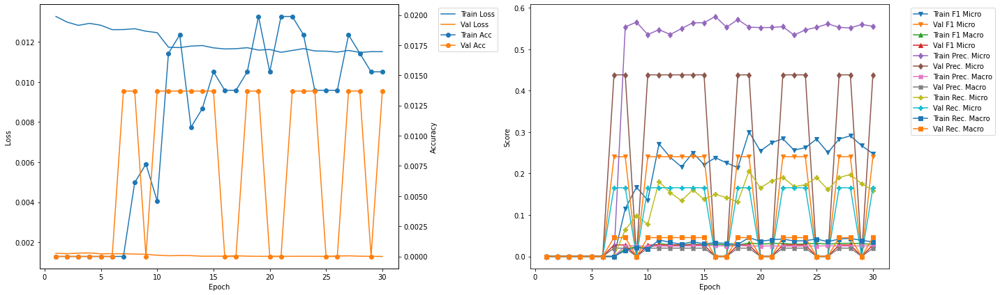

-------------------------------------------
FOLD 4
-------------------------------------------
Validation F1 Micro Score Increased (0.240602 --> 0.283582).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 18.52
Train Loss: 0.0115 	Validation Loss: 0.0013
Train Accuracy: 0.0122 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2194 	Validation F1 Micro: 0.2836
Train F1 Marco: 0.0289 	Validation F1 Macro: 0.0311
Train Precision Mirco: 0.533 	Validation Precision Micro: 0.5205
Train Precision Marco: 0.0325 	Validation Precision Macro: 0.0237
Train Recall Mirco: 0.1381 	Validation Recall Micro: 0.1949
Train Recall Marco: 0.0311 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 18.73
Train Loss: 0.0112 	Validation Loss: 0.0013
Train Accuracy: 0.0168 	Validation Accuracy: 0.0
Train F1 Mirco: 0.2212 	Validation F1 Micro: 0.2836
Train F1 Marco: 0.0274 	Validation F1 Macro: 0.0311
Train Precision Mirco: 0.5374 	Validation Precision Micro: 0.5205
Train Precision M

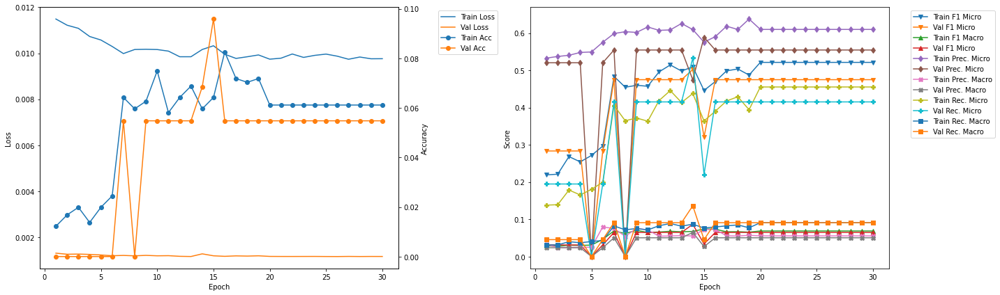

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 24.66
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.4803 	Validation F1 Micro: 0.3954
Train F1 Marco: 0.0695 	Validation F1 Macro: 0.0378
Train Precision Mirco: 0.5968 	Validation Precision Micro: 0.7123
Train Precision Marco: 0.0702 	Validation Precision Macro: 0.0324
Train Recall Mirco: 0.4018 	Validation Recall Micro: 0.2737
Train Recall Marco: 0.0812 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.502415 --> 0.511905).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 24.9
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0719 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.4919 	Validation F1 Micro: 0.5119
Train F1 Marco: 0.0661 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.6205 	Validation Precision Micro: 0.589
Train Precisio

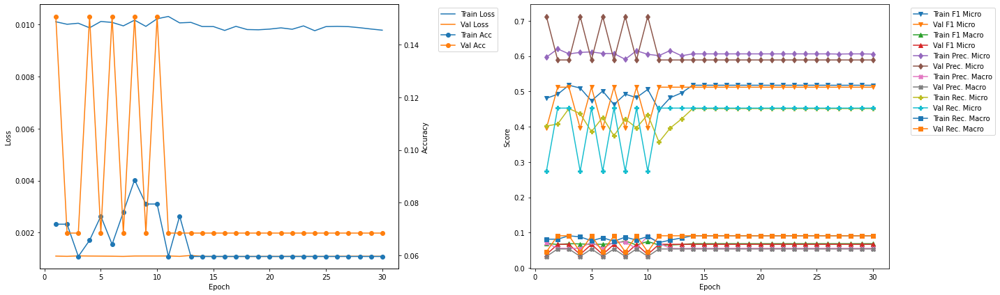

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 30.78
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0719 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4814 	Validation F1 Micro: 0.4885
Train F1 Marco: 0.0645 	Validation F1 Macro: 0.0669
Train Precision Mirco: 0.6111 	Validation Precision Micro: 0.5822
Train Precision Marco: 0.0548 	Validation Precision Macro: 0.0529
Train Recall Mirco: 0.3971 	Validation Recall Micro: 0.4208
Train Recall Marco: 0.0783 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 30.98
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0749 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.464 	Validation F1 Micro: 0.4828
Train F1 Marco: 0.0625 	Validation F1 Macro: 0.0667
Train Precision Mirco: 0.6149 	Validation Precision Micro: 0.5753
Train Precision Marco: 0.0549 	Validation Precision Macro: 0.053
Train Recall Mirco: 0.3725 	Va

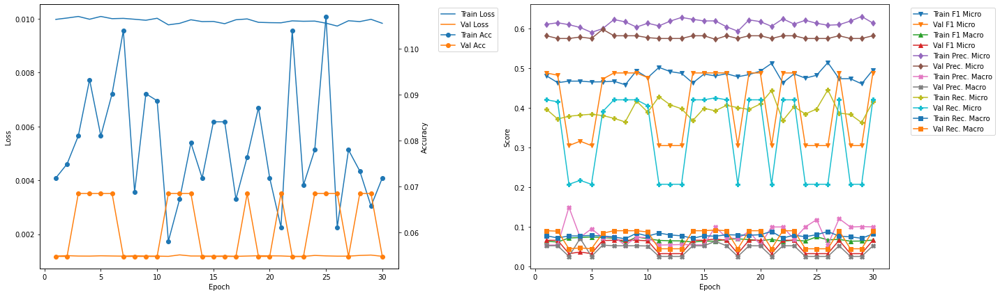

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 36.86
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0765 	Validation Accuracy: 0.1233
Train F1 Mirco: 0.4625 	Validation F1 Micro: 0.4061
Train F1 Marco: 0.0677 	Validation F1 Macro: 0.0382
Train Precision Mirco: 0.6118 	Validation Precision Micro: 0.726
Train Precision Marco: 0.0867 	Validation Precision Macro: 0.033
Train Recall Mirco: 0.3718 	Validation Recall Micro: 0.2819
Train Recall Marco: 0.0754 	Validation Recall Macro: 0.0455

Validation F1 Micro Score Increased (0.511905 --> 0.530120).  Saving model ...

Epoch 2 	Learning Rate: 0.01 	Time (min): 37.11
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0657 	Validation Accuracy: 0.0685
Train F1 Mirco: 0.499 	Validation F1 Micro: 0.5301
Train F1 Marco: 0.0669 	Validation F1 Macro: 0.0683
Train Precision Mirco: 0.6072 	Validation Precision Micro: 0.6111
Train Precision

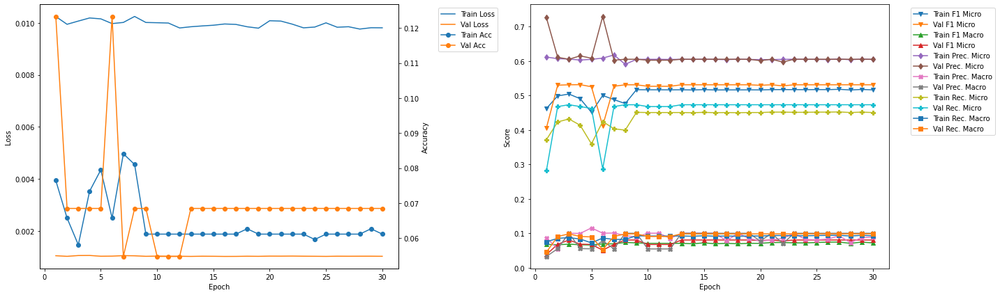

-------------------------------------------
FOLD 8
-------------------------------------------
Validation F1 Micro Score Increased (0.531722 --> 0.548193).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 43.13
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0702 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4536 	Validation F1 Micro: 0.5482
Train F1 Marco: 0.0734 	Validation F1 Macro: 0.0787
Train Precision Mirco: 0.5836 	Validation Precision Micro: 0.6276
Train Precision Marco: 0.0822 	Validation Precision Macro: 0.1023
Train Recall Mirco: 0.371 	Validation Recall Micro: 0.4866
Train Recall Marco: 0.0778 	Validation Recall Macro: 0.096

Epoch 2 	Learning Rate: 0.01 	Time (min): 43.33
Train Loss: 0.0099 	Validation Loss: 0.001
Train Accuracy: 0.0977 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4699 	Validation F1 Micro: 0.5482
Train F1 Marco: 0.065 	Validation F1 Macro: 0.0787
Train Precision Mirco: 0.6243 	Validation Precision Micro: 0.6276
Train Precision

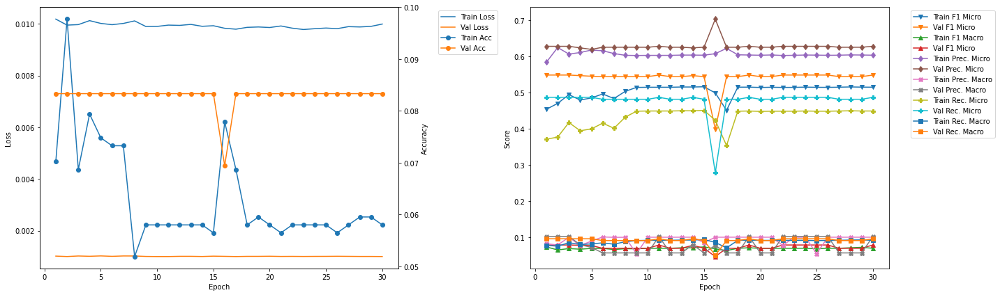

-------------------------------------------
FOLD 9
-------------------------------------------
Validation F1 Micro Score Increased (0.548193 --> 0.566474).  Saving model ...

Epoch 1 	Learning Rate: 0.01 	Time (min): 49.23
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4676 	Validation F1 Micro: 0.5665
Train F1 Marco: 0.0753 	Validation F1 Macro: 0.0734
Train Precision Mirco: 0.5952 	Validation Precision Micro: 0.6806
Train Precision Marco: 0.1075 	Validation Precision Macro: 0.0619
Train Recall Mirco: 0.3851 	Validation Recall Micro: 0.4851
Train Recall Marco: 0.0812 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 49.43
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0519 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.496 	Validation F1 Micro: 0.4015
Train F1 Marco: 0.0687 	Validation F1 Macro: 0.0394
Train Precision Mirco: 0.5984 	Validation Precision Micro: 0.7639
Train Precisio

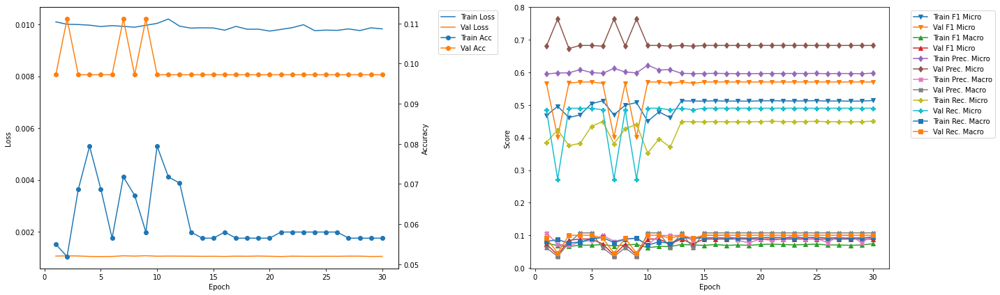

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 55.35
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0855 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4673 	Validation F1 Micro: 0.5313
Train F1 Marco: 0.0663 	Validation F1 Macro: 0.0694
Train Precision Mirco: 0.6285 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0897 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.3719 	Validation Recall Micro: 0.466
Train Recall Marco: 0.0746 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 55.55
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0278
Train F1 Mirco: 0.4921 	Validation F1 Micro: 0.5313
Train F1 Marco: 0.0668 	Validation F1 Macro: 0.0694
Train Precision Mirco: 0.6028 	Validation Precision Micro: 0.6181
Train Precision Marco: 0.0996 	Validation Precision Macro: 0.0562
Train Recall Mirco: 0.4157

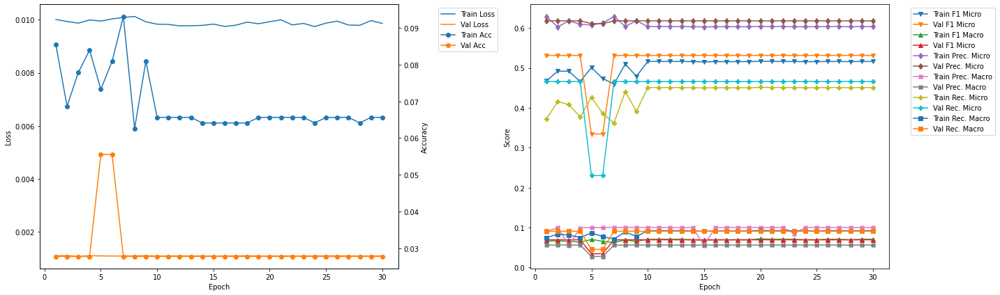

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 9 	Epoch: 4
Train Loss: 0.01 	Validation Loss: 0.001
Train Accuracy: 0.0794 	Validation Accuracy: 0.0972
Train F1 Mirco: 0.4696 	Validation F1 Micro: 0.5706
Train F1 Marco: 0.0699 	Validation F1 Macro: 0.0885
Train Precision Mirco: 0.6086 	Validation Precision Micro: 0.6828
Train Precision Marco: 0.0791 	Validation Precision Macro: 0.1073
Train Recall Mirco: 0.3822 	Validation Recall Micro: 0.4901
Train Recall Marco: 0.0794 	Validation Recall Macro: 0.1


In [26]:
vgg16bnLSTM_700_1_0_best = Kfold_train_CNN_RNN(model = vgg16bnLSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg16bnLSTM_700_1_0')

-------------------------------------------
FOLD 1
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 0.21
Train Loss: 0.0174 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.031 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0239 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.1148 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0669 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0179 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0263 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 0.42
Train Loss: 0.0123 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Va

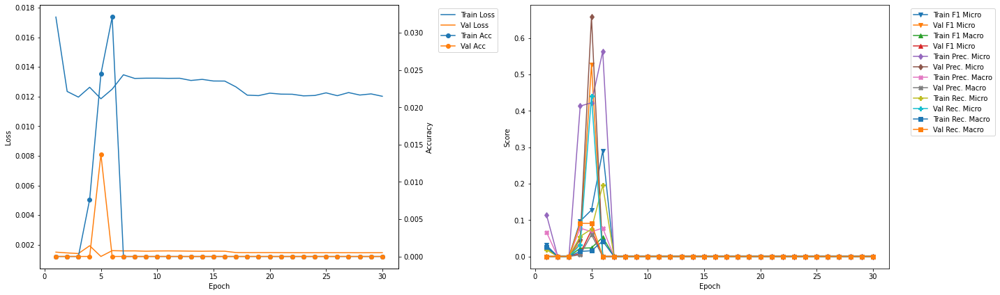

-------------------------------------------
FOLD 2
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 6.55
Train Loss: 0.0134 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 6.76
Train Loss: 0.0128 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall M

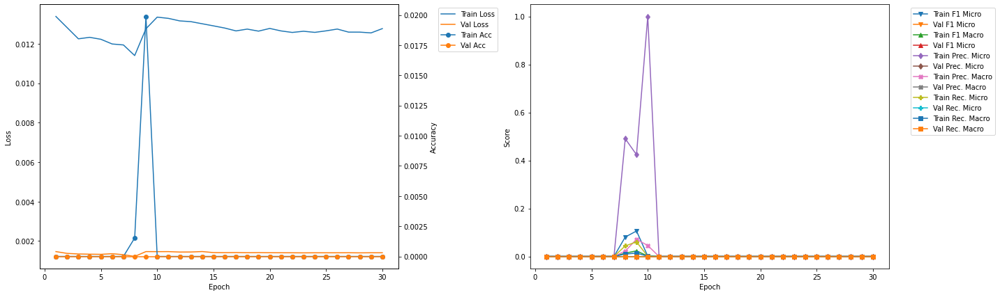

-------------------------------------------
FOLD 3
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 12.86
Train Loss: 0.0133 	Validation Loss: 0.0015
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall Macro: 0.0

Epoch 2 	Learning Rate: 0.01 	Time (min): 13.07
Train Loss: 0.0131 	Validation Loss: 0.0014
Train Accuracy: 0.0 	Validation Accuracy: 0.0
Train F1 Mirco: 0.0 	Validation F1 Micro: 0.0
Train F1 Marco: 0.0 	Validation F1 Macro: 0.0
Train Precision Mirco: 0.0 	Validation Precision Micro: 0.0
Train Precision Marco: 0.0 	Validation Precision Macro: 0.0
Train Recall Mirco: 0.0 	Validation Recall Micro: 0.0
Train Recall Marco: 0.0 	Validation Recall

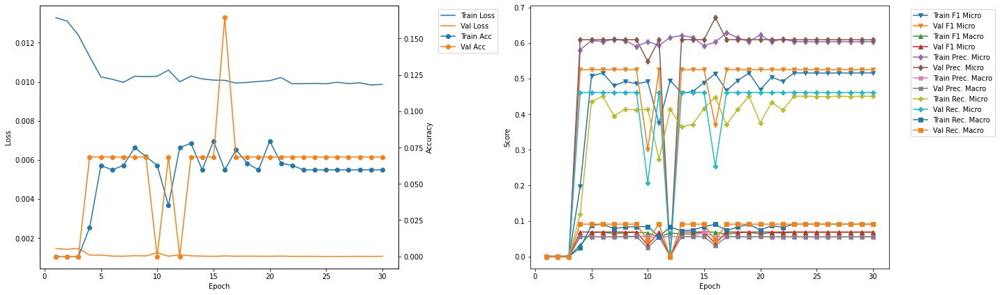

-------------------------------------------
FOLD 4
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 19.17
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0627 	Validation Accuracy: 0.0137
Train F1 Mirco: 0.5099 	Validation F1 Micro: 0.5071
Train F1 Marco: 0.0674 	Validation F1 Macro: 0.0681
Train Precision Mirco: 0.6014 	Validation Precision Micro: 0.6096
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0554
Train Recall Mirco: 0.4426 	Validation Recall Micro: 0.4341
Train Recall Marco: 0.0885 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 19.38
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0719 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4848 	Validation F1 Micro: 0.3885
Train F1 Marco: 0.0648 	Validation F1 Macro: 0.0387
Train Precision Mirco: 0.6083 	Validation Precision Micro: 0.7397
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0336
Train Recall Mirco: 0.403 	V

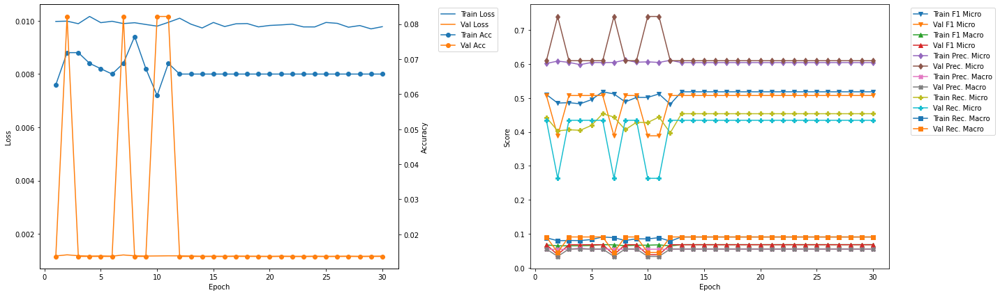

-------------------------------------------
FOLD 5
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 25.47
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0612 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.4885 	Validation F1 Micro: 0.5181
Train F1 Marco: 0.0654 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6078 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0546 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4083 	Validation Recall Micro: 0.4624
Train Recall Marco: 0.0814 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 25.68
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0581 	Validation Accuracy: 0.0822
Train F1 Mirco: 0.5168 	Validation F1 Micro: 0.5181
Train F1 Marco: 0.0684 	Validation F1 Macro: 0.0673
Train Precision Mirco: 0.6063 	Validation Precision Micro: 0.589
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0535
Train Recall Mirco: 0.4503 	Va

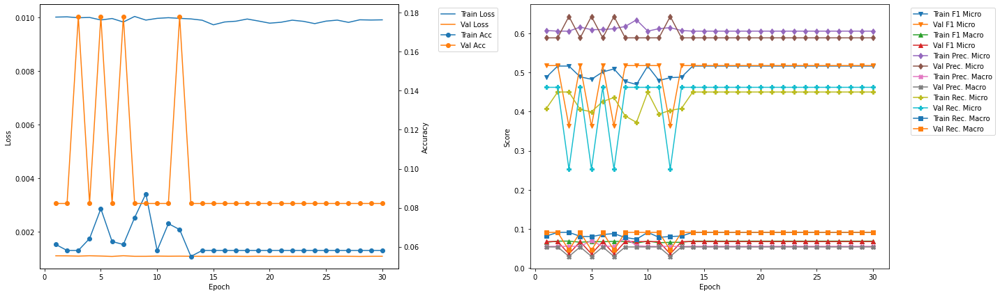

-------------------------------------------
FOLD 6
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 31.78
Train Loss: 0.0102 	Validation Loss: 0.001
Train Accuracy: 0.0688 	Validation Accuracy: 0.0548
Train F1 Mirco: 0.4902 	Validation F1 Micro: 0.5078
Train F1 Marco: 0.0658 	Validation F1 Macro: 0.0646
Train Precision Mirco: 0.6123 	Validation Precision Micro: 0.5548
Train Precision Marco: 0.0551 	Validation Precision Macro: 0.0504
Train Recall Mirco: 0.4087 	Validation Recall Micro: 0.4682
Train Recall Marco: 0.0817 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 31.99
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0627 	Validation Accuracy: 0.1507
Train F1 Mirco: 0.5079 	Validation F1 Micro: 0.374
Train F1 Marco: 0.0678 	Validation F1 Macro: 0.0351
Train Precision Mirco: 0.6121 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0554 	Validation Precision Macro: 0.0286
Train Recall Mirco: 0.434 	V

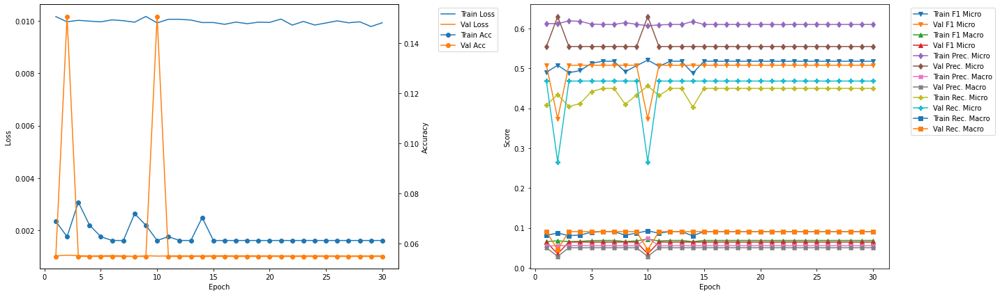

-------------------------------------------
FOLD 7
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 38.09
Train Loss: 0.0101 	Validation Loss: 0.0012
Train Accuracy: 0.052 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.5015 	Validation F1 Micro: 0.5257
Train F1 Marco: 0.0718 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.5916 	Validation Precision Micro: 0.6259
Train Precision Marco: 0.0633 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4352 	Validation Recall Micro: 0.4532
Train Recall Marco: 0.0903 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 38.3
Train Loss: 0.01 	Validation Loss: 0.0012
Train Accuracy: 0.0612 	Validation Accuracy: 0.0959
Train F1 Mirco: 0.4953 	Validation F1 Micro: 0.5272
Train F1 Marco: 0.066 	Validation F1 Macro: 0.07
Train Precision Mirco: 0.6051 	Validation Precision Micro: 0.6301
Train Precision Marco: 0.0545 	Validation Precision Macro: 0.0573
Train Recall Mirco: 0.4192 	Valid

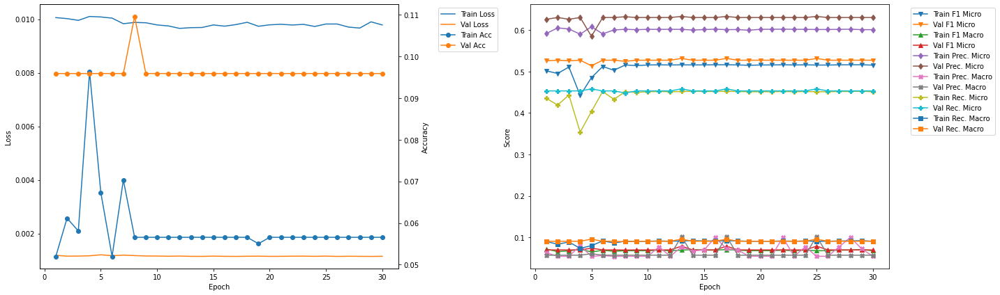

-------------------------------------------
FOLD 8
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 44.41
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0733 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4816 	Validation F1 Micro: 0.3956
Train F1 Marco: 0.0646 	Validation F1 Macro: 0.039
Train Precision Mirco: 0.6041 	Validation Precision Micro: 0.75
Train Precision Marco: 0.0543 	Validation Precision Macro: 0.0341
Train Recall Mirco: 0.4003 	Validation Recall Micro: 0.2687
Train Recall Marco: 0.08 	Validation Recall Macro: 0.0455

Epoch 2 	Learning Rate: 0.01 	Time (min): 44.62
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0656 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.4966 	Validation F1 Micro: 0.3956
Train F1 Marco: 0.0702 	Validation F1 Macro: 0.039
Train Precision Mirco: 0.6066 	Validation Precision Micro: 0.75
Train Precision Marco: 0.082 	Validation Precision Macro: 0.0341
Train Recall Mirco: 0.4204 	Validat

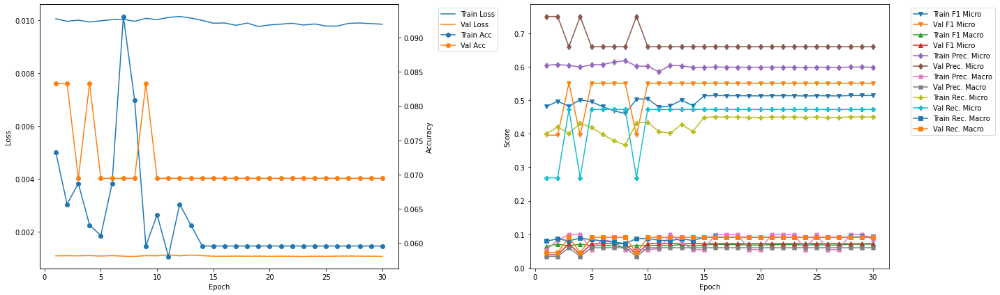

-------------------------------------------
FOLD 9
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 50.73
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0611 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5065 	Validation F1 Micro: 0.4756
Train F1 Marco: 0.0708 	Validation F1 Macro: 0.0638
Train Precision Mirco: 0.6127 	Validation Precision Micro: 0.5417
Train Precision Marco: 0.0749 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4317 	Validation Recall Micro: 0.4239
Train Recall Marco: 0.0874 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 50.94
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0595 	Validation Accuracy: 0.0833
Train F1 Mirco: 0.5223 	Validation F1 Micro: 0.4756
Train F1 Marco: 0.0714 	Validation F1 Macro: 0.0638
Train Precision Mirco: 0.612 	Validation Precision Micro: 0.5417
Train Precision Marco: 0.101 	Validation Precision Macro: 0.0492
Train Recall Mirco: 0.4555 	Va

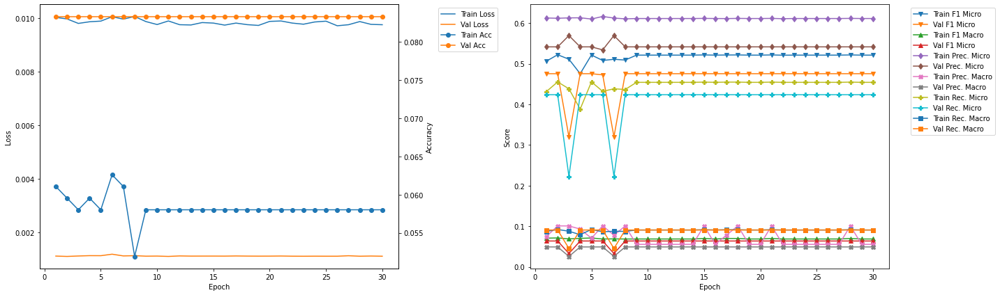

-------------------------------------------
FOLD 10
-------------------------------------------
Epoch 1 	Learning Rate: 0.01 	Time (min): 57.03
Train Loss: 0.0101 	Validation Loss: 0.0011
Train Accuracy: 0.0626 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.4895 	Validation F1 Micro: 0.5301
Train F1 Marco: 0.0708 	Validation F1 Macro: 0.069
Train Precision Mirco: 0.6074 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.0638 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4099 	Validation Recall Micro: 0.4681
Train Recall Marco: 0.0847 	Validation Recall Macro: 0.0909

Epoch 2 	Learning Rate: 0.01 	Time (min): 57.24
Train Loss: 0.0099 	Validation Loss: 0.0011
Train Accuracy: 0.055 	Validation Accuracy: 0.1111
Train F1 Mirco: 0.5164 	Validation F1 Micro: 0.5301
Train F1 Marco: 0.071 	Validation F1 Macro: 0.069
Train Precision Mirco: 0.6044 	Validation Precision Micro: 0.6111
Train Precision Marco: 0.1003 	Validation Precision Macro: 0.0556
Train Recall Mirco: 0.4508 

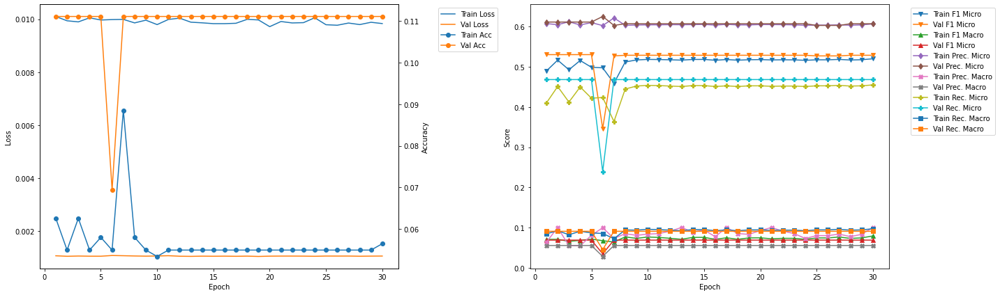

------------------------------------------------------------
------------------------------------------------------------

Metrics of Best Model:
Fold: 8 	Epoch: 3
Train Loss: 0.01 	Validation Loss: 0.0011
Train Accuracy: 0.0687 	Validation Accuracy: 0.0694
Train F1 Mirco: 0.4823 	Validation F1 Micro: 0.5507
Train F1 Marco: 0.066 	Validation F1 Macro: 0.0719
Train Precision Mirco: 0.6038 	Validation Precision Micro: 0.6597
Train Precision Marco: 0.0996 	Validation Precision Macro: 0.06
Train Recall Mirco: 0.4015 	Validation Recall Micro: 0.4726
Train Recall Marco: 0.0808 	Validation Recall Macro: 0.0909


In [27]:
vgg19bnLSTM_700_1_0_best = Kfold_train_CNN_RNN(model = vgg19bnLSTM_700_1_0, training_data = training_data, learning_rate = 0.01, k_folds = 10, n_epochs = 30, model_name = 'vgg19bnLSTM_700_1_0')

In [28]:
print('Total Training Time (HR:M:S): ' + str(datetime.timedelta(hours = ((time.time() - START) / 60 / 60))).rsplit('.', 1)[0])

Total Training Time (HR:M:S): 7:46:59


## Training Summary

### Summary Table

In [29]:
summaryDF = pd.DataFrame({
    'ResNet18' : resnet18LSTM_700_1_0_best,
    'ResNet50' : resnet50LSTM_700_1_0_best,
    'ResNet101' : resnet101LSTM_700_1_0_best,
    'DenseNet121' : densenet121LSTM_700_1_0_best,
    'DenseNet169' : densenet169LSTM_700_1_0_best,
    'DenseNet201' : densenet201LSTM_700_1_0_best,
    'VGG11_BN' : vgg11bnLSTM_700_1_0_best,
    'VGG16_BN' : vgg16bnLSTM_700_1_0_best,
    'VGG19_BN' : vgg19bnLSTM_700_1_0_best
})
summaryDF.index = ['Fold', 'Epoch', 'Train Loss', 'Train Accuracy', 'Train F1 Micro', 'Train F1 Macro', 'Train Precision Micro', 'Train Precision Macro', 'Train Recall Micro', 'Train Recall Macro',
                   'Val Loss', 'Val Accuracy', 'Val F1 Micro', 'Val F1 Macro', 'Val Precision Micro', 'Val Precision Macro', 'Val Recall Micro', 'Val Recall Macro']

summaryDF

,ResNet18,ResNet50,ResNet101,DenseNet121,DenseNet169,DenseNet201,VGG11_BN,VGG16_BN,VGG19_BN
Fold,8.000000,6.000000,6.000000,3.000000,4.000000,10.000000,2.000000,9.000000,8.000000
Epoch,1.000000,5.000000,5.000000,2.000000,13.000000,11.000000,4.000000,4.000000,3.000000
Train Loss,0.010011,0.012829,0.010126,0.010048,0.010168,0.010459,0.010011,0.009971,0.010011
Train Accuracy,0.058015,0.004587,0.059633,0.056575,0.062691,0.056489,0.081040,0.079389,0.068702
Train F1 Micro,0.512871,0.123805,0.501987,0.516737,0.424220,0.410256,0.482471,0.469553,0.482284
Train F1 Macro,0.068075,0.019413,0.067078,0.081875,0.087197,0.097278,0.065560,0.069910,0.065979
Train Precision Micro,0.600763,0.537118,0.602544,0.604103,0.607447,0.603774,0.627256,0.608577,0.603790
Train Precision Macro,0.054615,0.024414,0.054564,0.179881,0.209178,0.206255,0.056387,0.079052,0.099577
Train Recall Micro,0.447413,0.069966,0.430193,0.451448,0.325913,0.310680,0.391991,0.382235,0.401489
Train Recall Macro,0.090909,0.016112,0.087206,0.097988,0.076379,0.084601,0.078696,0.079440,0.080803


### Training Summary Graph

In [30]:
import plotly
import plotly.graph_objects as go

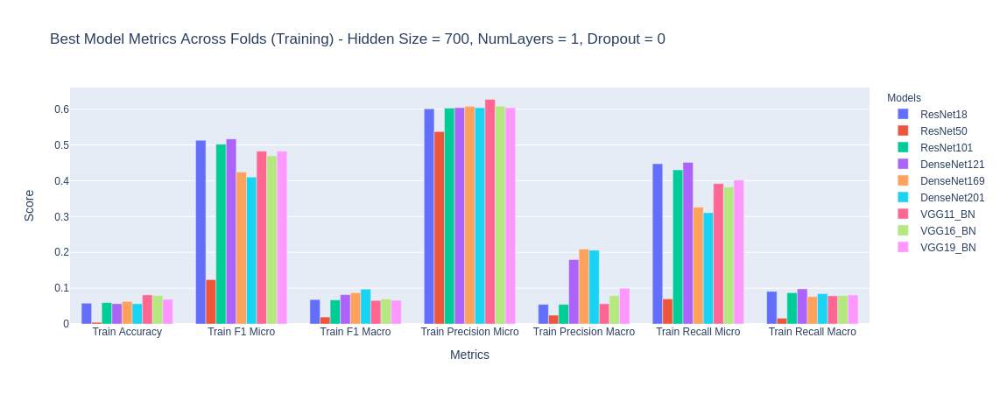

In [31]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[3:10], y = summaryDF['ResNet18'][3:10]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[3:10], y = summaryDF['ResNet50'][3:10]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[3:10], y = summaryDF['ResNet101'][3:10]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[3:10], y = summaryDF['DenseNet121'][3:10]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[3:10], y = summaryDF['DenseNet169'][3:10]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[3:10], y = summaryDF['DenseNet201'][3:10]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[3:10], y = summaryDF['VGG11_BN'][3:10]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[3:10], y = summaryDF['VGG16_BN'][3:10]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[3:10], y = summaryDF['VGG19_BN'][3:10]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Training) - Hidden Size = 700, NumLayers = 1, Dropout = 0',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()

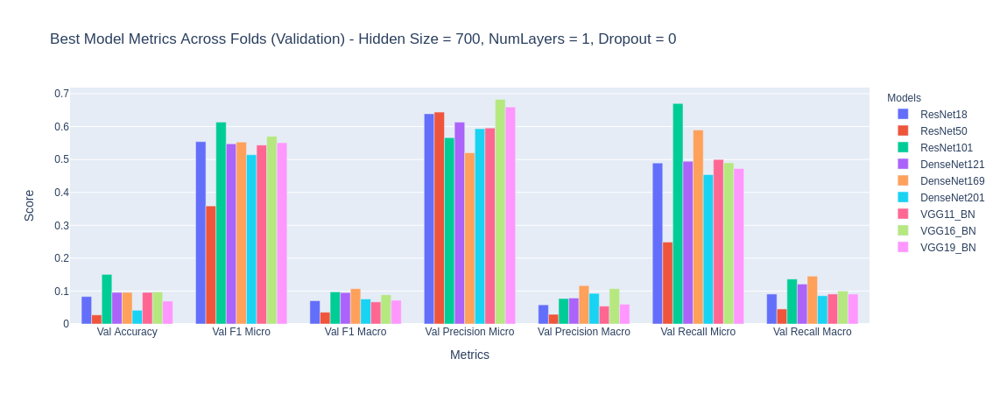

In [32]:
fig = go.Figure(data = [
    go.Bar(name = 'ResNet18', x = summaryDF.index[11:], y = summaryDF['ResNet18'][11:]),
    go.Bar(name = 'ResNet50', x = summaryDF.index[11:], y = summaryDF['ResNet50'][11:]),
    go.Bar(name = 'ResNet101', x = summaryDF.index[11:], y = summaryDF['ResNet101'][11:]),
    go.Bar(name = 'DenseNet121', x = summaryDF.index[11:], y = summaryDF['DenseNet121'][11:]),
    go.Bar(name = 'DenseNet169', x = summaryDF.index[11:], y = summaryDF['DenseNet169'][11:]),
    go.Bar(name = 'DenseNet201', x = summaryDF.index[11:], y = summaryDF['DenseNet201'][11:]),
    go.Bar(name = 'VGG11_BN', x = summaryDF.index[11:], y = summaryDF['VGG11_BN'][11:]),
    go.Bar(name = 'VGG16_BN', x = summaryDF.index[11:], y = summaryDF['VGG16_BN'][11:]),
    go.Bar(name = 'VGG19_BN', x = summaryDF.index[11:], y = summaryDF['VGG19_BN'][11:]),
])
fig.update_layout(barmode = 'group',
                  title = 'Best Model Metrics Across Folds (Validation) - Hidden Size = 700, NumLayers = 1, Dropout = 0',
                  xaxis_title = 'Metrics',
                  yaxis_title = 'Score',
                  legend_title = 'Models')
fig.show()